In [82]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import os
import datetime
import statistics

from csv import reader

In [83]:
os.chdir("E:\\")

In [84]:
file=pd.read_excel("Consumption data.xlsx",header=None)

In [85]:
file=file[2:]

In [86]:
file.reset_index(drop=True,inplace=True)

In [87]:
file

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,NaN,House No,2022-03-01 00:00:00,2022-04-01 00:00:00,2022-05-01 00:00:00,2022-06-01 00:00:00,2022-07-01 00:00:00,2022-08-01 00:00:00,2022-09-01 00:00:00,2022-10-01 00:00:00,2022-11-01 00:00:00,2022-12-01 00:00:00,2023-01-01 00:00:00,2023-02-01 00:00:00,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,Total consumption
1,1.0,A - 101,91,315,460,828,428,504,237,83,49,137,283,58,54,174,386,4087
2,2.0,A - 102,879,587,708,563,410,541,208,209,397,1504,1156,349,212,232,216,8171
3,3.0,A - 103,46,22,50,93,24,43,37,36,29,200,72,27,35,41,81,836
4,4.0,A - 104,1262,659,739,834,692,719,310,258,633,1951,2058,590,212,208,318,11443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,177.0,C - 1003,0,0,0,0,0,0,87,78,161,18,321,91,62,156,293,1267
178,178.0,C - 1004,0,0,0,0,0,0,0,0,0,0,85,37,43,60,73,298
179,179.0,C - 1005,0,0,0,0,0,0,164,62,56,636,442,68,84,88,115,1715
180,180.0,C - 1006,0,0,0,0,0,0,0,0,0,0,0,219,231,366,851,1667


In [97]:
headers=file.iloc[0]

df=file.iloc[1:]

df.columns=headers

In [99]:
df=df.iloc[:,1:]

In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181 entries, 1 to 181
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   House No             181 non-null    object
 1   2022-03-01 00:00:00  181 non-null    object
 2   2022-04-01 00:00:00  181 non-null    object
 3   2022-05-01 00:00:00  181 non-null    object
 4   2022-06-01 00:00:00  181 non-null    object
 5   2022-07-01 00:00:00  181 non-null    object
 6   2022-08-01 00:00:00  181 non-null    object
 7   2022-09-01 00:00:00  179 non-null    object
 8   2022-10-01 00:00:00  180 non-null    object
 9   2022-11-01 00:00:00  180 non-null    object
 10  2022-12-01 00:00:00  180 non-null    object
 11  2023-01-01 00:00:00  180 non-null    object
 12  2023-02-01 00:00:00  181 non-null    object
 13  2023-03-01 00:00:00  181 non-null    object
 14  2023-04-01 00:00:00  181 non-null    object
 15  2023-05-01 00:00:00  181 non-null    object
 16  Total co

In [265]:
df.iloc[:-1,0]

1       A - 101
2       A - 102
3       A - 103
4       A - 104
5       A - 105
         ...   
176    C - 1002
177    C - 1003
178    C - 1004
179    C - 1005
180    C - 1006
Name: House No, Length: 180, dtype: object

In [102]:
df1=df.iloc[:-1,:]

In [266]:
code_house={}

for i in range(df1.shape[0]):
    code_house[df1.iloc[i,-1]]=df.iloc[i,0]



In [267]:
code_house

{1101.0: 'A - 101',
 1102.0: 'A - 102',
 1103.0: 'A - 103',
 1104.0: 'A - 104',
 1105.0: 'A - 105',
 1106.0: 'A - 106',
 1201.0: 'A - 201',
 1202.0: 'A - 202',
 1203.0: 'A - 203',
 1204.0: 'A - 204',
 1205.0: 'A - 205',
 1206.0: 'A - 206',
 1301.0: 'A - 301',
 1302.0: 'A - 302',
 1303.0: 'A - 303',
 1304.0: 'A - 304',
 1305.0: 'A - 305',
 1306.0: 'A - 306',
 1401.0: 'A - 401',
 1402.0: 'A - 402',
 1403.0: 'A - 403',
 1404.0: 'A - 404',
 1405.0: 'A - 405',
 1406.0: 'A - 406',
 1501.0: 'A - 501',
 1502.0: 'A - 502',
 1503.0: 'A - 503',
 1504.0: 'A - 504',
 1505.0: 'A - 505',
 1506.0: 'A - 506',
 1601.0: 'A - 601',
 1602.0: 'A - 602',
 1603.0: 'A - 603',
 1604.0: 'A - 604',
 1605.0: 'A - 605',
 1606.0: 'A - 606',
 1701.0: 'A - 701',
 1702.0: 'A - 702',
 1703.0: 'A - 703',
 1704.0: 'A - 704',
 1705.0: 'A - 705',
 1706.0: 'A - 706',
 1801.0: 'A - 801',
 1802.0: 'A - 802',
 1803.0: 'A - 803',
 1804.0: 'A - 804',
 1805.0: 'A - 805',
 1806.0: 'A - 806',
 1901.0: 'A - 901',
 1902.0: 'A - 902',


In [104]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 1 to 180
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   House No             180 non-null    object
 1   2022-03-01 00:00:00  180 non-null    object
 2   2022-04-01 00:00:00  180 non-null    object
 3   2022-05-01 00:00:00  180 non-null    object
 4   2022-06-01 00:00:00  180 non-null    object
 5   2022-07-01 00:00:00  180 non-null    object
 6   2022-08-01 00:00:00  180 non-null    object
 7   2022-09-01 00:00:00  178 non-null    object
 8   2022-10-01 00:00:00  179 non-null    object
 9   2022-11-01 00:00:00  179 non-null    object
 10  2022-12-01 00:00:00  179 non-null    object
 11  2023-01-01 00:00:00  179 non-null    object
 12  2023-02-01 00:00:00  180 non-null    object
 13  2023-03-01 00:00:00  180 non-null    object
 14  2023-04-01 00:00:00  180 non-null    object
 15  2023-05-01 00:00:00  180 non-null    object
 16  Total co

In [107]:
df1.shape

(180, 18)

In [132]:
df1['House ID']=0

C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\2728394563.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['House ID']=0


In [258]:
df1

,2022-03-01 00:00:00,2022-04-01 00:00:00,2022-05-01 00:00:00,2022-06-01 00:00:00,2022-07-01 00:00:00,2022-08-01 00:00:00,2022-09-01 00:00:00,2022-10-01 00:00:00,2022-11-01 00:00:00,2022-12-01 00:00:00,2023-01-01 00:00:00,2023-02-01 00:00:00,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,Total consumption,House ID
1,91.0,315.0,460.0,828.0,428.0,504.0,237.0,83.0,49.0,137.0,283.0,58.0,54.0,174.0,386.0,4087.0,1101.0
2,879.0,587.0,708.0,563.0,410.0,541.0,208.0,209.0,397.0,1504.0,1156.0,349.0,212.0,232.0,216.0,8171.0,1102.0
3,46.0,22.0,50.0,93.0,24.0,43.0,37.0,36.0,29.0,200.0,72.0,27.0,35.0,41.0,81.0,836.0,1103.0
4,1262.0,659.0,739.0,834.0,692.0,719.0,310.0,258.0,633.0,1951.0,2058.0,590.0,212.0,208.0,318.0,11443.0,1104.0
5,0.0,830.0,320.0,309.0,480.0,571.0,262.0,113.0,94.0,529.0,564.0,119.0,112.0,153.0,360.0,4816.0,1105.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,0.0,0.0,0.0,0.0,0.0,0.0,102.0,189.0,16.0,146.0,63.0,65.0,128.0,154.0,392.0,1255.0,31002.0
177,0.0,0.0,0.0,0.0,0.0,0.0,87.0,78.0,161.0,18.0,321.0,91.0,62.0,156.0,293.0,1267.0,31003.0
178,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,85.0,37.0,43.0,60.0,73.0,298.0,31004.0
179,0.0,0.0,0.0,0.0,0.0,0.0,164.0,62.0,56.0,636.0,442.0,68.0,84.0,88.0,115.0,1715.0,31005.0


In [156]:
j=list(df1.iloc[:,0])


for i in range(df1.shape[0]):
    
    print(i)
    temp=j[i].split()
    print(temp)
    
    if (temp[0]=='A'):
        temp1='1'+ temp[2]
        print(float(temp1))
        df1.iloc[i,17]= temp1
    
    elif (temp[0]=='B'):
        temp1='2'+ temp[2]
        print(temp1)
        df1.iloc[i,17]=temp1
        
        
    elif (temp[0]=='C'):
        temp1='3'+ temp[2]
        print(temp1)
        df1.iloc[i,17]=temp1
    
    del temp1
    del temp
    
    

1
['A', '-', '102']
1102.0
2
['A', '-', '103']
1103.0
3
['A', '-', '104']
1104.0
4
['A', '-', '105']
1105.0
5
['A', '-', '106']
1106.0
6
['A', '-', '201']
1201.0
7
['A', '-', '202']
1202.0
8
['A', '-', '203']
1203.0
9
['A', '-', '204']
1204.0
10
['A', '-', '205']
1205.0
11
['A', '-', '206']
1206.0
12
['A', '-', '301']
1301.0
13
['A', '-', '302']
1302.0
14
['A', '-', '303']
1303.0
15
['A', '-', '304']
1304.0
16
['A', '-', '305']
1305.0
17
['A', '-', '306']
1306.0
18
['A', '-', '401']
1401.0
19
['A', '-', '402']
1402.0
20
['A', '-', '403']
1403.0
21
['A', '-', '404']
1404.0
22
['A', '-', '405']
1405.0
23
['A', '-', '406']
1406.0
24
['A', '-', '501']
1501.0
25
['A', '-', '502']
1502.0
26
['A', '-', '503']
1503.0
27
['A', '-', '504']
1504.0
28
['A', '-', '505']
1505.0
29
['A', '-', '506']
1506.0
30
['A', '-', '601']
1601.0
31
['A', '-', '602']
1602.0
32
['A', '-', '603']
1603.0
33
['A', '-', '604']
1604.0
34
['A', '-', '605']
1605.0
35
['A', '-', '606']
1606.0
36
['A', '-', '701']
1701.0
3

IndexError: list index out of range

In [160]:
df1

,House No,2022-03-01 00:00:00,2022-04-01 00:00:00,2022-05-01 00:00:00,2022-06-01 00:00:00,2022-07-01 00:00:00,2022-08-01 00:00:00,2022-09-01 00:00:00,2022-10-01 00:00:00,2022-11-01 00:00:00,2022-12-01 00:00:00,2023-01-01 00:00:00,2023-02-01 00:00:00,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,Total consumption,House ID
1,A - 101,91,315,460,828,428,504,237,83,49,137,283,58,54,174,386,4087,1101
2,A - 102,879,587,708,563,410,541,208,209,397,1504,1156,349,212,232,216,8171,1102
3,A - 103,46,22,50,93,24,43,37,36,29,200,72,27,35,41,81,836,1103
4,A - 104,1262,659,739,834,692,719,310,258,633,1951,2058,590,212,208,318,11443,1104
5,A - 105,0,830,320,309,480,571,262,113,94,529,564,119,112,153,360,4816,1105
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,C - 1002,0,0,0,0,0,0,102,189,16,146,63,65,128,154,392,1255,31002
177,C - 1003,0,0,0,0,0,0,87,78,161,18,321,91,62,156,293,1267,31003
178,C - 1004,0,0,0,0,0,0,0,0,0,0,85,37,43,60,73,298,31004
179,C - 1005,0,0,0,0,0,0,164,62,56,636,442,68,84,88,115,1715,31005


In [163]:
df1.drop(columns='House No',inplace=True)

C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\777743202.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop(columns='House No',inplace=True)


In [165]:
df1=df1.astype(float)

In [167]:
df1.dtypes

0
2022-03-01 00:00:00    float64
2022-04-01 00:00:00    float64
2022-05-01 00:00:00    float64
2022-06-01 00:00:00    float64
2022-07-01 00:00:00    float64
2022-08-01 00:00:00    float64
2022-09-01 00:00:00    float64
2022-10-01 00:00:00    float64
2022-11-01 00:00:00    float64
2022-12-01 00:00:00    float64
2023-01-01 00:00:00    float64
2023-02-01 00:00:00    float64
2023-03-01 00:00:00    float64
2023-04-01 00:00:00    float64
2023-05-01 00:00:00    float64
Total consumption      float64
House ID               float64
dtype: object

In [169]:
df2=df1.copy()

In [170]:
df2.describe()

,2022-03-01 00:00:00,2022-04-01 00:00:00,2022-05-01 00:00:00,2022-06-01 00:00:00,2022-07-01 00:00:00,2022-08-01 00:00:00,2022-09-01 00:00:00,2022-10-01 00:00:00,2022-11-01 00:00:00,2022-12-01 00:00:00,2023-01-01 00:00:00,2023-02-01 00:00:00,2023-03-01 00:00:00,2023-04-01 00:00:00,2023-05-01 00:00:00,Total consumption,House ID
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000,178.000000,179.000000,179.000000,179.000000,179.000000,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,96.133333,117.533333,120.133333,183.811111,135.405556,145.127778,169.904494,122.122905,140.268156,404.340782,411.463687,167.550000,147.444444,163.922222,250.855556,2768.138889,4353.500000
std,225.510158,291.041635,264.766291,410.897502,283.570190,298.341000,160.370358,100.404891,160.458142,424.109432,395.884705,162.967258,107.050618,128.745752,215.247892,2741.125489,6192.106403
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1101.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67.500000,60.000000,50.500000,110.500000,132.000000,68.750000,70.500000,80.750000,109.000000,1131.250000,1803.750000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,132.500000,101.000000,103.000000,280.000000,303.000000,114.500000,122.000000,130.000000,191.000000,1939.500000,2653.500000
75%,0.000000,85.250000,119.750000,209.000000,157.250000,188.750000,225.000000,165.500000,185.500000,563.000000,586.000000,214.000000,205.500000,205.000000,334.250000,3514.250000,3503.250000
max,1262.000000,2530.000000,1790.000000,2746.000000,1721.000000,2029.000000,942.000000,594.000000,1166.000000,2073.000000,2058.000000,1143.000000,521.000000,829.000000,1041.000000,17452.000000,31006.000000


In [171]:
df2.columns

Index([2022-03-01 00:00:00, 2022-04-01 00:00:00, 2022-05-01 00:00:00,
       2022-06-01 00:00:00, 2022-07-01 00:00:00, 2022-08-01 00:00:00,
       2022-09-01 00:00:00, 2022-10-01 00:00:00, 2022-11-01 00:00:00,
       2022-12-01 00:00:00, 2023-01-01 00:00:00, 2023-02-01 00:00:00,
       2023-03-01 00:00:00, 2023-04-01 00:00:00, 2023-05-01 00:00:00,
       'Total consumption',          'House ID'],
      dtype='object', name=0)

In [179]:
ref={"1":"Jan","2":"Feb","3":"Mar","4":"Apr","5":"May","6":"Jun","7":"Jul","8":"Aug","9":"Sept","10":"Oct","11":"Nov","12":"Dec"}

ref["3"]

'Mar'

In [184]:
ref={"1":"Jan","2":"Feb","3":"Mar","4":"Apr","5":"May","6":"Jun","7":"Jul","8":"Aug","9":"Sept","10":"Oct","11":"Nov","12":"Dec"}
mod={}
from datetime import datetime
month_dict={}
for i in df2.columns:
    
    month=str(i.month)
    year=str(i.year)
    
    
    new_month=ref[month]
    
    comb=new_month + "/" + year
    
    mod[i]=comb

    print(i.month)
    print(i.year)
    

3
2022
4
2022
5
2022
6
2022
7
2022
8
2022
9
2022
10
2022
11
2022
12
2022
1
2023
2
2023
3
2023
4
2023
5
2023


AttributeError: 'str' object has no attribute 'month'

In [186]:
mod["Total consumption"]="Total Consumption"

In [187]:
df2.rename(columns=mod,inplace=True)

In [188]:
df2

,Mar/2022,Apr/2022,May/2022,Jun/2022,Jul/2022,Aug/2022,Sept/2022,Oct/2022,Nov/2022,Dec/2022,Jan/2023,Feb/2023,Mar/2023,Apr/2023,May/2023,Total Consumption,House ID
1,91.0,315.0,460.0,828.0,428.0,504.0,237.0,83.0,49.0,137.0,283.0,58.0,54.0,174.0,386.0,4087.0,1101.0
2,879.0,587.0,708.0,563.0,410.0,541.0,208.0,209.0,397.0,1504.0,1156.0,349.0,212.0,232.0,216.0,8171.0,1102.0
3,46.0,22.0,50.0,93.0,24.0,43.0,37.0,36.0,29.0,200.0,72.0,27.0,35.0,41.0,81.0,836.0,1103.0
4,1262.0,659.0,739.0,834.0,692.0,719.0,310.0,258.0,633.0,1951.0,2058.0,590.0,212.0,208.0,318.0,11443.0,1104.0
5,0.0,830.0,320.0,309.0,480.0,571.0,262.0,113.0,94.0,529.0,564.0,119.0,112.0,153.0,360.0,4816.0,1105.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176,0.0,0.0,0.0,0.0,0.0,0.0,102.0,189.0,16.0,146.0,63.0,65.0,128.0,154.0,392.0,1255.0,31002.0
177,0.0,0.0,0.0,0.0,0.0,0.0,87.0,78.0,161.0,18.0,321.0,91.0,62.0,156.0,293.0,1267.0,31003.0
178,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,85.0,37.0,43.0,60.0,73.0,298.0,31004.0
179,0.0,0.0,0.0,0.0,0.0,0.0,164.0,62.0,56.0,636.0,442.0,68.0,84.0,88.0,115.0,1715.0,31005.0


In [190]:
consumption=df2["Total Consumption"]

In [192]:
df3=df2.sort_values(by='Total Consumption',ignore_index=True)

In [193]:
df3

,Mar/2022,Apr/2022,May/2022,Jun/2022,Jul/2022,Aug/2022,Sept/2022,Oct/2022,Nov/2022,Dec/2022,Jan/2023,Feb/2023,Mar/2023,Apr/2023,May/2023,Total Consumption,House ID
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2706.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,4.0,3505.0
2,0.0,0.0,0.0,0.0,0.0,0.0,29.0,8.0,5.0,0.0,3.0,19.0,13.0,15.0,17.0,109.0,2205.0
3,0.0,0.0,0.0,0.0,0.0,0.0,84.0,4.0,6.0,6.0,12.0,10.0,10.0,17.0,12.0,161.0,3406.0
4,0.0,36.0,6.0,1.0,20.0,9.0,17.0,21.0,22.0,23.0,20.0,19.0,23.0,25.0,26.0,268.0,1502.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,1262.0,659.0,739.0,834.0,692.0,719.0,310.0,258.0,633.0,1951.0,2058.0,590.0,212.0,208.0,318.0,11443.0,1104.0
176,1118.0,884.0,958.0,1593.0,1232.0,1135.0,716.0,594.0,397.0,1423.0,1005.0,512.0,510.0,485.0,755.0,13317.0,1406.0
177,646.0,1076.0,1233.0,1809.0,1603.0,1510.0,793.0,313.0,267.0,1218.0,923.0,369.0,385.0,670.0,991.0,13806.0,1706.0
178,1211.0,903.0,804.0,962.0,1045.0,1046.0,613.0,463.0,572.0,1978.0,1967.0,945.0,508.0,544.0,1041.0,14602.0,1801.0


In [194]:
df3["Percentile rank"]=df3['Total Consumption'].rank(pct=True)

In [195]:
df3

,Mar/2022,Apr/2022,May/2022,Jun/2022,Jul/2022,Aug/2022,Sept/2022,Oct/2022,Nov/2022,Dec/2022,Jan/2023,Feb/2023,Mar/2023,Apr/2023,May/2023,Total Consumption,House ID,Percentile rank
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2706.0,0.005556
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,4.0,3505.0,0.011111
2,0.0,0.0,0.0,0.0,0.0,0.0,29.0,8.0,5.0,0.0,3.0,19.0,13.0,15.0,17.0,109.0,2205.0,0.016667
3,0.0,0.0,0.0,0.0,0.0,0.0,84.0,4.0,6.0,6.0,12.0,10.0,10.0,17.0,12.0,161.0,3406.0,0.022222
4,0.0,36.0,6.0,1.0,20.0,9.0,17.0,21.0,22.0,23.0,20.0,19.0,23.0,25.0,26.0,268.0,1502.0,0.027778
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,1262.0,659.0,739.0,834.0,692.0,719.0,310.0,258.0,633.0,1951.0,2058.0,590.0,212.0,208.0,318.0,11443.0,1104.0,0.977778
176,1118.0,884.0,958.0,1593.0,1232.0,1135.0,716.0,594.0,397.0,1423.0,1005.0,512.0,510.0,485.0,755.0,13317.0,1406.0,0.983333
177,646.0,1076.0,1233.0,1809.0,1603.0,1510.0,793.0,313.0,267.0,1218.0,923.0,369.0,385.0,670.0,991.0,13806.0,1706.0,0.988889
178,1211.0,903.0,804.0,962.0,1045.0,1046.0,613.0,463.0,572.0,1978.0,1967.0,945.0,508.0,544.0,1041.0,14602.0,1801.0,0.994444


In [200]:
tower_A =pd.DataFrame()
tower_B =pd.DataFrame()
tower_C =pd.DataFrame()

df3["Tower"]="000"

for i in range(df3.shape[0]):
    
    temp=str(df3["House ID"][i])
    
    if temp[0]=="1":
        df3["Tower"][i]="A"
    
    elif temp[0]=="2":
        df3["Tower"][i]="B"
    
    elif temp[0]=="3":
        df3["Tower"][i]="C"
    

tower_A=df3[df3["Tower"]=="A"].drop(columns=['Tower','Percentile rank']).reset_index(drop=True)
tower_B=df3[df3["Tower"]=="B"].drop(columns=['Tower','Percentile rank']).reset_index(drop=True)
tower_C=df3[df3["Tower"]=="C"].drop(columns=['Tower','Percentile rank']).reset_index(drop=True)

C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\220934867.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3["Tower"][i]="B"
C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\220934867.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3["Tower"][i]="C"
C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\220934867.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3["Tower"][i]="A"


In [207]:
tower_A_upd=tower_A.iloc[:,6:]
tower_B_upd=tower_B.iloc[:,6:]
tower_C_upd=tower_C.iloc[:,6:]

In [209]:
tower_A_upd["Percentile"]=tower_A_upd["Total Consumption"].rank(pct=True)

C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\424492081.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tower_A_upd["Percentile"]=tower_A_upd["Total Consumption"].rank(pct=True)


In [210]:
tower_B_upd["Percentile"]=tower_B_upd["Total Consumption"].rank(pct=True)
tower_C_upd["Percentile"]=tower_C_upd["Total Consumption"].rank(pct=True)

C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\2191787287.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tower_B_upd["Percentile"]=tower_B_upd["Total Consumption"].rank(pct=True)
C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\2191787287.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tower_C_upd["Percentile"]=tower_C_upd["Total Consumption"].rank(pct=True)


In [215]:
bins=[0,0.25,0.5,0.75,1]
bin_vals=[1,2,3,4]

tower_A_upd['cats']=pd.cut(tower_A_upd["Percentile"],bins=bins,labels=bin_vals,include_lowest=True)
tower_B_upd['cats']=pd.cut(tower_B_upd["Percentile"],bins=bins,labels=bin_vals,include_lowest=True)
tower_C_upd['cats']=pd.cut(tower_C_upd["Percentile"],bins=bins,labels=bin_vals,include_lowest=True)

C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\4269329830.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tower_A_upd['cats']=pd.cut(tower_A_upd["Percentile"],bins=bins,labels=bin_vals,include_lowest=True)
C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\4269329830.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tower_B_upd['cats']=pd.cut(tower_B_upd["Percentile"],bins=bins,labels=bin_vals,include_lowest=True)
C:\Users\Lights\AppData\Local\Temp\ipykernel_23668\4269329830.py:6: SettingWithCopyW

In [219]:
A_cluster_L25=pd.DataFrame()
A_cluster_25T50=pd.DataFrame()
A_cluster_50T75=pd.DataFrame()
A_cluster_75M=pd.DataFrame()

B_cluster_L25=pd.DataFrame()
B_cluster_25T50=pd.DataFrame()
B_cluster_50T75=pd.DataFrame()
B_cluster_75M=pd.DataFrame()

C_cluster_L25=pd.DataFrame()
C_cluster_25T50=pd.DataFrame()
C_cluster_50T75=pd.DataFrame()
C_cluster_75M=pd.DataFrame()

In [221]:
A_cluster_L25=tower_A_upd[tower_A_upd['cats']==1].drop(columns='cats').reset_index(drop=True)
A_cluster_25T50=tower_A_upd[tower_A_upd['cats']==2].drop(columns='cats').reset_index(drop=True)
A_cluster_50T75=tower_A_upd[tower_A_upd['cats']==3].drop(columns='cats').reset_index(drop=True)
A_cluster_75M=tower_A_upd[tower_A_upd['cats']==4].drop(columns='cats').reset_index(drop=True)

B_cluster_L25=tower_B_upd[tower_B_upd['cats']==1].drop(columns='cats').reset_index(drop=True)
B_cluster_25T50=tower_B_upd[tower_B_upd['cats']==2].drop(columns='cats').reset_index(drop=True)
B_cluster_50T75=tower_B_upd[tower_B_upd['cats']==3].drop(columns='cats').reset_index(drop=True)
B_cluster_75M=tower_B_upd[tower_B_upd['cats']==4].drop(columns='cats').reset_index(drop=True)

C_cluster_L25=tower_C_upd[tower_C_upd['cats']==1].drop(columns='cats').reset_index(drop=True)
C_cluster_25T50=tower_C_upd[tower_C_upd['cats']==2].drop(columns='cats').reset_index(drop=True)
C_cluster_50T75=tower_C_upd[tower_C_upd['cats']==3].drop(columns='cats').reset_index(drop=True)
C_cluster_75M=tower_C_upd[tower_C_upd['cats']==4].drop(columns='cats').reset_index(drop=True)

In [275]:
all_tow_clusters=[A_cluster_L25,A_cluster_25T50,A_cluster_50T75,A_cluster_75M,B_cluster_L25,B_cluster_25T50,B_cluster_50T75,B_cluster_75M,C_cluster_L25,C_cluster_25T50,C_cluster_50T75,C_cluster_75M]

A Cluster L25

In [231]:
A_cluster_L25

,Sept/2022,Oct/2022,Nov/2022,Dec/2022,Jan/2023,Feb/2023,Mar/2023,Apr/2023,May/2023,Total Consumption,House ID,Percentile
0,17.0,21.0,22.0,23.0,20.0,19.0,23.0,25.0,26.0,268.0,1502.0,0.016667
1,24.0,21.0,12.0,74.0,33.0,9.0,23.0,17.0,42.0,678.0,1205.0,0.033333
2,37.0,36.0,29.0,200.0,72.0,27.0,35.0,41.0,81.0,836.0,1103.0,0.050000
3,83.0,78.0,81.0,88.0,83.0,53.0,109.0,80.0,61.0,1106.0,1503.0,0.066667
4,75.0,67.0,61.0,194.0,82.0,47.0,55.0,52.0,28.0,1260.0,1401.0,0.083333
5,69.0,65.0,61.0,335.0,311.0,52.0,66.0,48.0,45.0,1602.0,1405.0,0.100000
6,70.0,66.0,79.0,83.0,99.0,95.0,99.0,108.0,135.0,1724.0,1902.0,0.116667
7,63.0,60.0,59.0,19.0,235.0,75.0,78.0,52.0,360.0,1773.0,1106.0,0.133333
8,125.0,109.0,103.0,256.0,269.0,67.0,82.0,97.0,110.0,2075.0,1601.0,0.150000
9,159.0,122.0,205.0,432.0,227.0,149.0,158.0,163.0,205.0,2156.0,1806.0,0.166667


In [232]:
keys_a_l25=[i for i in A_cluster_L25.iloc[:,-2]]

In [238]:
months=A_cluster_L25.columns[:-3]

In [239]:
master_a_l25={}
for i in range(len(keys_a_l25)):
    month_tuple=[]
    
    for j in range(len(months)):
        temp=(months[j],A_cluster_L25.iloc[i,j])
        month_tuple.append(temp)
    
    master_a_l25[keys_a_l25[i]]=month_tuple
    del month_tuple

In [246]:
keys_a_l25

[1502.0,
 1205.0,
 1103.0,
 1503.0,
 1401.0,
 1405.0,
 1902.0,
 1106.0,
 1601.0,
 1806.0,
 11006.0,
 1804.0,
 1201.0,
 1402.0,
 1803.0]

In [252]:
master_a_l25[1804]

[('Sept/2022', 92.0),
 ('Oct/2022', 87.0),
 ('Nov/2022', 91.0),
 ('Dec/2022', 448.0),
 ('Jan/2023', 281.0),
 ('Feb/2023', 83.0),
 ('Mar/2023', 82.0),
 ('Apr/2023', 87.0),
 ('May/2023', 103.0)]

In [268]:
code_house

{1101.0: 'A - 101',
 1102.0: 'A - 102',
 1103.0: 'A - 103',
 1104.0: 'A - 104',
 1105.0: 'A - 105',
 1106.0: 'A - 106',
 1201.0: 'A - 201',
 1202.0: 'A - 202',
 1203.0: 'A - 203',
 1204.0: 'A - 204',
 1205.0: 'A - 205',
 1206.0: 'A - 206',
 1301.0: 'A - 301',
 1302.0: 'A - 302',
 1303.0: 'A - 303',
 1304.0: 'A - 304',
 1305.0: 'A - 305',
 1306.0: 'A - 306',
 1401.0: 'A - 401',
 1402.0: 'A - 402',
 1403.0: 'A - 403',
 1404.0: 'A - 404',
 1405.0: 'A - 405',
 1406.0: 'A - 406',
 1501.0: 'A - 501',
 1502.0: 'A - 502',
 1503.0: 'A - 503',
 1504.0: 'A - 504',
 1505.0: 'A - 505',
 1506.0: 'A - 506',
 1601.0: 'A - 601',
 1602.0: 'A - 602',
 1603.0: 'A - 603',
 1604.0: 'A - 604',
 1605.0: 'A - 605',
 1606.0: 'A - 606',
 1701.0: 'A - 701',
 1702.0: 'A - 702',
 1703.0: 'A - 703',
 1704.0: 'A - 704',
 1705.0: 'A - 705',
 1706.0: 'A - 706',
 1801.0: 'A - 801',
 1802.0: 'A - 802',
 1803.0: 'A - 803',
 1804.0: 'A - 804',
 1805.0: 'A - 805',
 1806.0: 'A - 806',
 1901.0: 'A - 901',
 1902.0: 'A - 902',


In [381]:
all_tow_clusters[0].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15 entries, 0 to 14
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Sept/2022          15 non-null     float64
 1   Oct/2022           15 non-null     float64
 2   Nov/2022           15 non-null     float64
 3   Dec/2022           15 non-null     float64
 4   Jan/2023           15 non-null     float64
 5   Feb/2023           15 non-null     float64
 6   Mar/2023           15 non-null     float64
 7   Apr/2023           15 non-null     float64
 8   May/2023           15 non-null     float64
 9   Total Consumption  15 non-null     float64
 10  House ID           15 non-null     float64
 11  Percentile         15 non-null     float64
dtypes: float64(12)
memory usage: 1.5 KB


In [338]:
monthly_avg["Wet Bulb Temperature [C]"]

Converted Timestamp
1982-01-31    10.629220
1982-02-28    13.088899
1982-03-31    15.547769
1982-04-30    17.221903
1982-05-31    23.006398
1982-06-30    24.767833
1982-07-31    25.936828
1982-08-31    26.336425
1982-09-30    24.498083
1982-10-31    18.711331
1982-11-30    14.599181
1982-12-31    12.152715
Freq: M, Name: Wet Bulb Temperature [C], dtype: float64

In [339]:
weather=pd.read_excel("weatherfile.xlsx")
weather["Converted Timestamp"]=pd.to_datetime(weather["Converted Timestamp"],format="%d/%m/%Y %H:%M:%S")
monthly_avg=weather.groupby(pd.Grouper(freq='M',key="Converted Timestamp")).mean()
WBT=list(monthly_avg["Wet Bulb Temperature [C]"][8:])
DBT=list(monthly_avg["Dry Bulb Temperature [C]"][8:])
atm_p=list(monthly_avg["Atmospheric Pressure [kPa]"][8:])
rh=list(monthly_avg["Relative Humidity %"][8:])
wind_s=list(monthly_avg["Wind Speed [m/s]"][8:])
glob_sol=list(monthly_avg["Global Solar [Wh/m2]"][8:])
direct_sol=list(monthly_avg["Normal Solar [Wh/m2]"][8:])
diff_sol=list(monthly_avg["Diffuse Solar [Wh/m2]"][8:])
for i in range(5):
    WBT.append(monthly_avg["Wet Bulb Temperature [C]"][i])
    DBT.append(monthly_avg["Dry Bulb Temperature [C]"][i])
    atm_p.append(monthly_avg["Atmospheric Pressure [kPa]"][i])
    rh.append(monthly_avg["Relative Humidity %"][i])
    wind_s.append(monthly_avg["Wind Speed [m/s]"][i])
    glob_sol.append(monthly_avg["Global Solar [Wh/m2]"][i])
    direct_sol.append(monthly_avg["Normal Solar [Wh/m2]"][i])
    diff_sol.append(monthly_avg["Diffuse Solar [Wh/m2]"][i])
   

    
    

In [351]:
weather=[WBT,DBT,atm_p,rh,wind_s,glob_sol,direct_sol,diff_sol]
weather_lab=['WBT','DBT','atm_p','rh','wind_s','glob_sol','direct_sol','diff_sol']

In [340]:
WBT

[24.498083333333334,
 18.71133064516129,
 14.599180555555556,
 12.152715053763442,
 10.629220430107527,
 13.088898809523808,
 15.547768817204302,
 17.22190277777778,
 23.006397849462363]

In [349]:
all_tow_clusters[0]

,Sept/2022,Oct/2022,Nov/2022,Dec/2022,Jan/2023,Feb/2023,Mar/2023,Apr/2023,May/2023,Total Consumption,House ID,Percentile
0,17.0,21.0,22.0,23.0,20.0,19.0,23.0,25.0,26.0,268.0,1502.0,0.016667
1,24.0,21.0,12.0,74.0,33.0,9.0,23.0,17.0,42.0,678.0,1205.0,0.033333
2,37.0,36.0,29.0,200.0,72.0,27.0,35.0,41.0,81.0,836.0,1103.0,0.050000
3,83.0,78.0,81.0,88.0,83.0,53.0,109.0,80.0,61.0,1106.0,1503.0,0.066667
4,75.0,67.0,61.0,194.0,82.0,47.0,55.0,52.0,28.0,1260.0,1401.0,0.083333
5,69.0,65.0,61.0,335.0,311.0,52.0,66.0,48.0,45.0,1602.0,1405.0,0.100000
6,70.0,66.0,79.0,83.0,99.0,95.0,99.0,108.0,135.0,1724.0,1902.0,0.116667
7,63.0,60.0,59.0,19.0,235.0,75.0,78.0,52.0,360.0,1773.0,1106.0,0.133333
8,125.0,109.0,103.0,256.0,269.0,67.0,82.0,97.0,110.0,2075.0,1601.0,0.150000
9,159.0,122.0,205.0,432.0,227.0,149.0,158.0,163.0,205.0,2156.0,1806.0,0.166667


In [373]:
required_L25=all_tow_clusters[0].iloc[:,:-3]
melted_L25=required_L25.melt(var_name="Month",value_name="Consumption")
sb.kdeplot(data=clust_melted,x='Consumption', hue='Month', fill=True, ax=axes[0])
axes[0].set_title('Kernel Density Estimate (KDE)')

for month in clust_melted['Month'].unique():
    sb.kdeplot(data=clust_melted[clust_melted['Month'] == month]['Consumption'], cumulative=True, ax=axes[1])
    axes[1].set_title('Cumulative Distribution Function (CL25)')

    # # PL25 plot
    sb.histplot(data=clust_melted, x='Consumption', hue='Month', element='step', stat='density', common_norm=False, ax=axes[2])
    axes[2].set_title('Probability Density Function (PL25)')


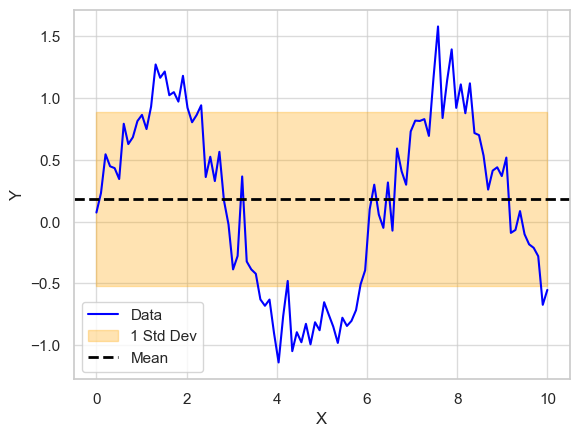

In [393]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
x = np.linspace(0, 10, 100)  # X values
y = np.sin(x) + np.random.normal(0, 0.2, 100)  # Y values with noise

# Calculate mean and standard deviation
mean_y = np.mean(y)
std_dev = np.std(y)

# Create a figure and axis
fig, ax = plt.subplots()

# Plot the line graph
ax.plot(x, y, label='Data', color='blue')

# Create the standard deviation band by shading the area between mean - std_dev and mean + std_dev
ax.fill_between(x, mean_y - std_dev, mean_y + std_dev, color='orange', alpha=0.3, label='1 Std Dev')

# Add a horizontal line for the mean
ax.axhline(mean_y, color='black', linestyle='dashed', linewidth=2, label='Mean')

# Set labels and legend
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.legend()

# Show the plot
plt.show()


In [398]:
all_tow_clusters[0].describe()

,Sept/2022,Oct/2022,Nov/2022,Dec/2022,Jan/2023,Feb/2023,Mar/2023,Apr/2023,May/2023,Total Consumption,House ID,Percentile
count,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.000000,15.00000,15.000000,15.000000,15.000000
mean,89.533333,81.333333,85.733333,203.533333,241.533333,83.066667,93.200000,88.200000,115.60000,1731.533333,2116.666667,0.133333
std,47.277096,39.664066,52.193961,136.002031,205.148332,55.927845,52.395747,48.931731,85.50756,760.309793,2473.101716,0.074536
min,17.000000,21.000000,12.000000,19.000000,20.000000,9.000000,23.000000,17.000000,26.00000,268.000000,1103.000000,0.016667
25%,66.000000,62.500000,60.000000,85.500000,82.500000,49.500000,60.500000,50.000000,53.00000,1183.000000,1303.000000,0.075000
50%,83.000000,78.000000,81.000000,199.000000,227.000000,75.000000,82.000000,87.000000,103.00000,1773.000000,1502.000000,0.133333
75%,120.500000,111.000000,97.000000,280.000000,296.000000,98.500000,117.500000,120.500000,144.50000,2285.500000,1803.500000,0.191667
max,183.000000,150.000000,205.000000,448.000000,732.000000,203.000000,215.000000,173.000000,360.00000,2709.000000,11006.000000,0.250000


house id  1


percentile is  0.05
l25 mark chk


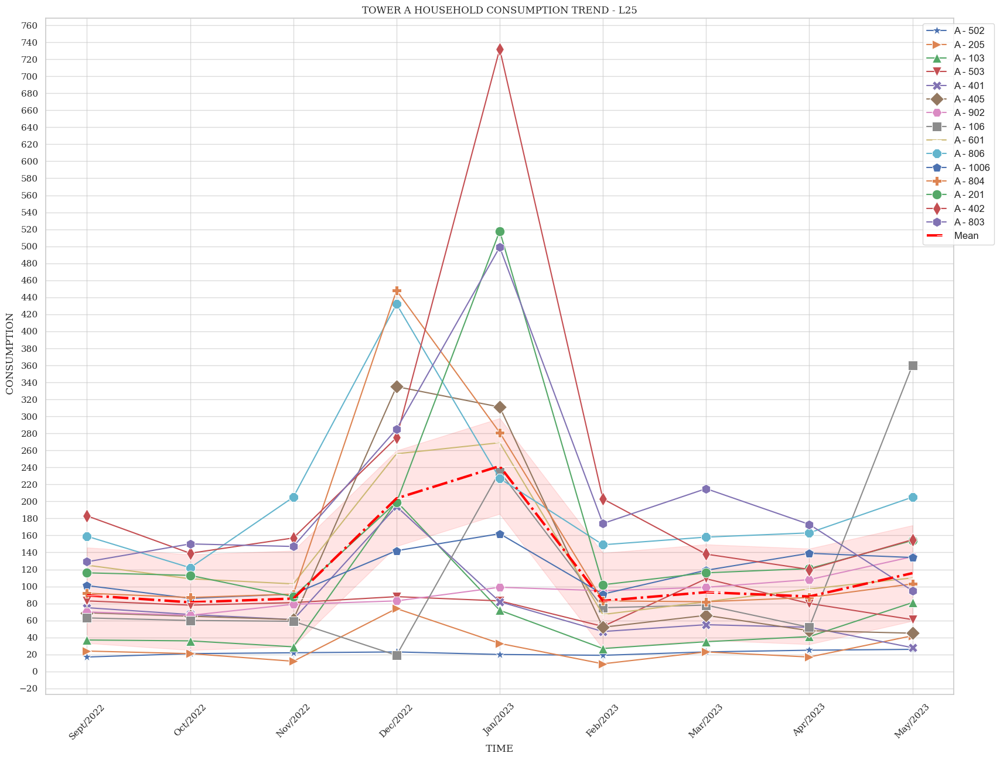

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


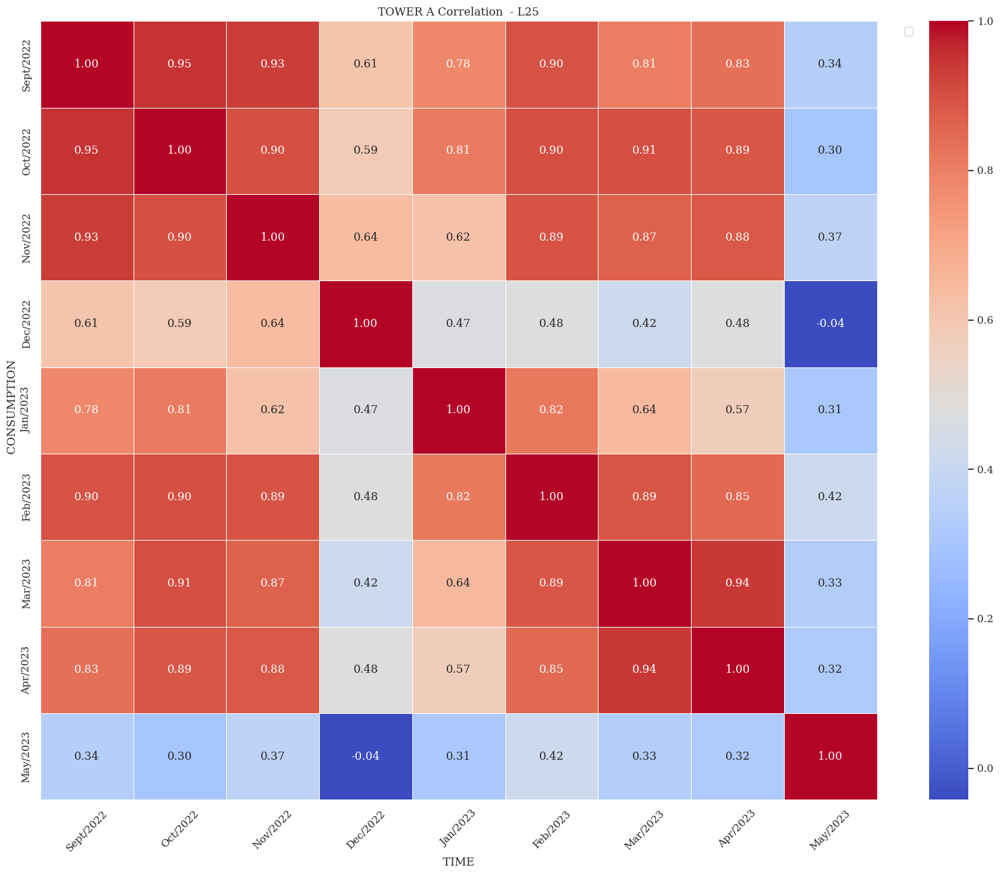

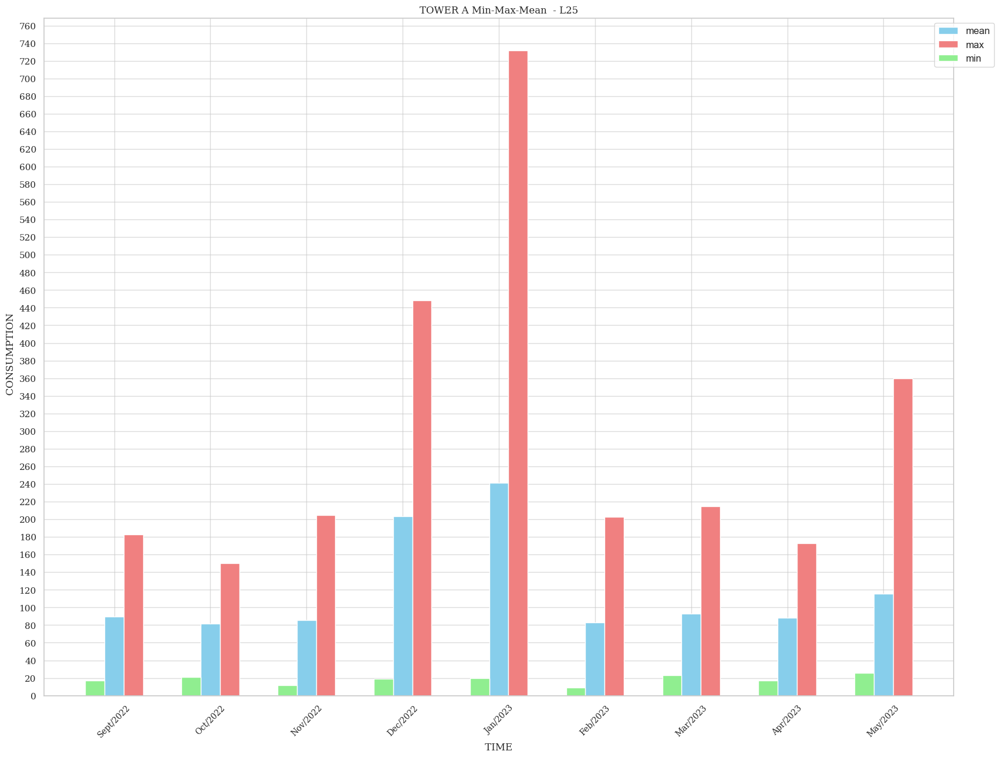

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


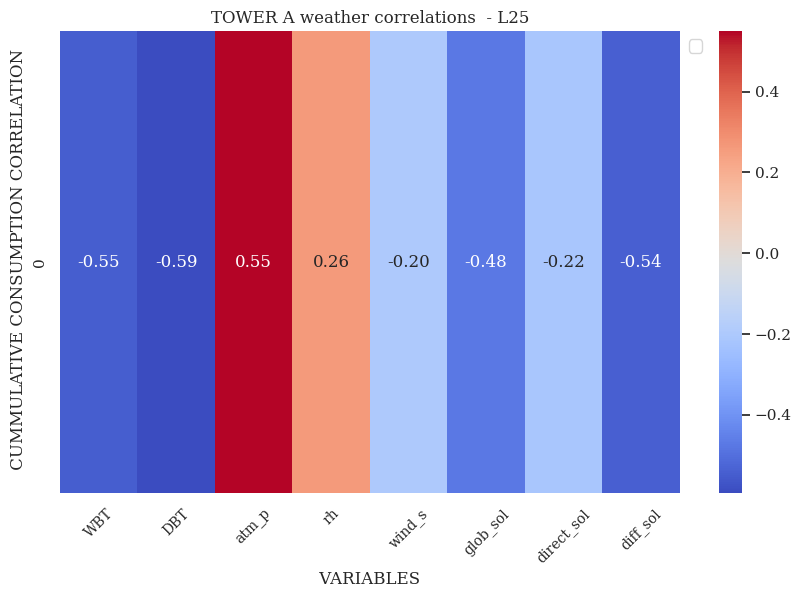

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

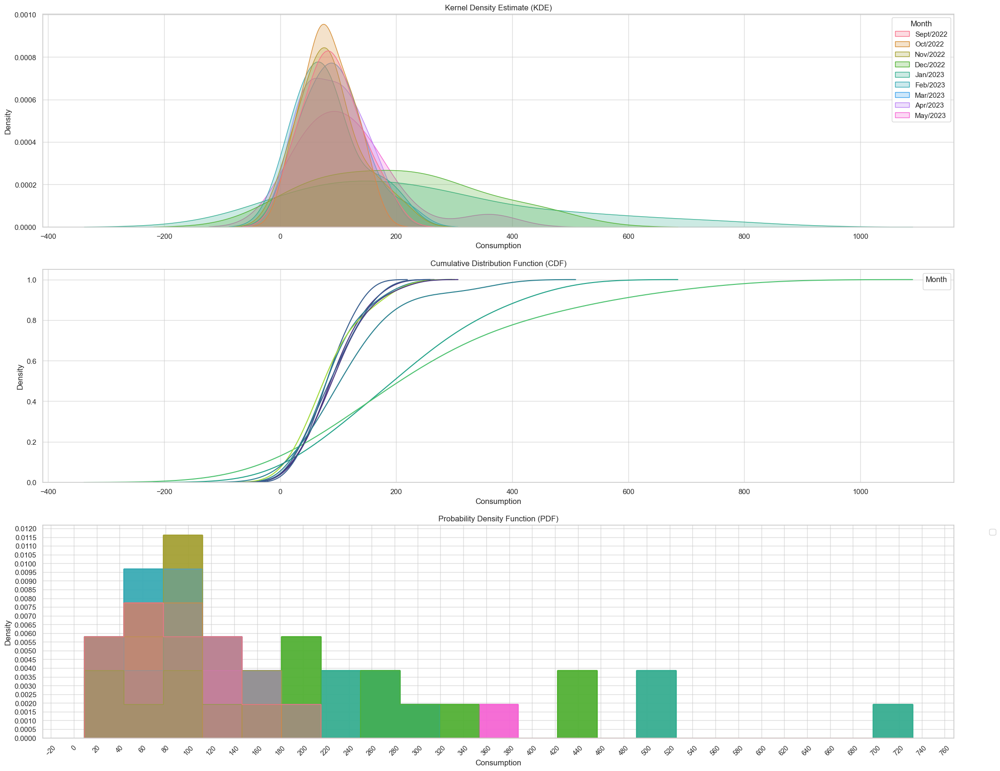

--------------------PLOT EXIT -------------------
house id  1


percentile is  0.3
25t50 mark chk


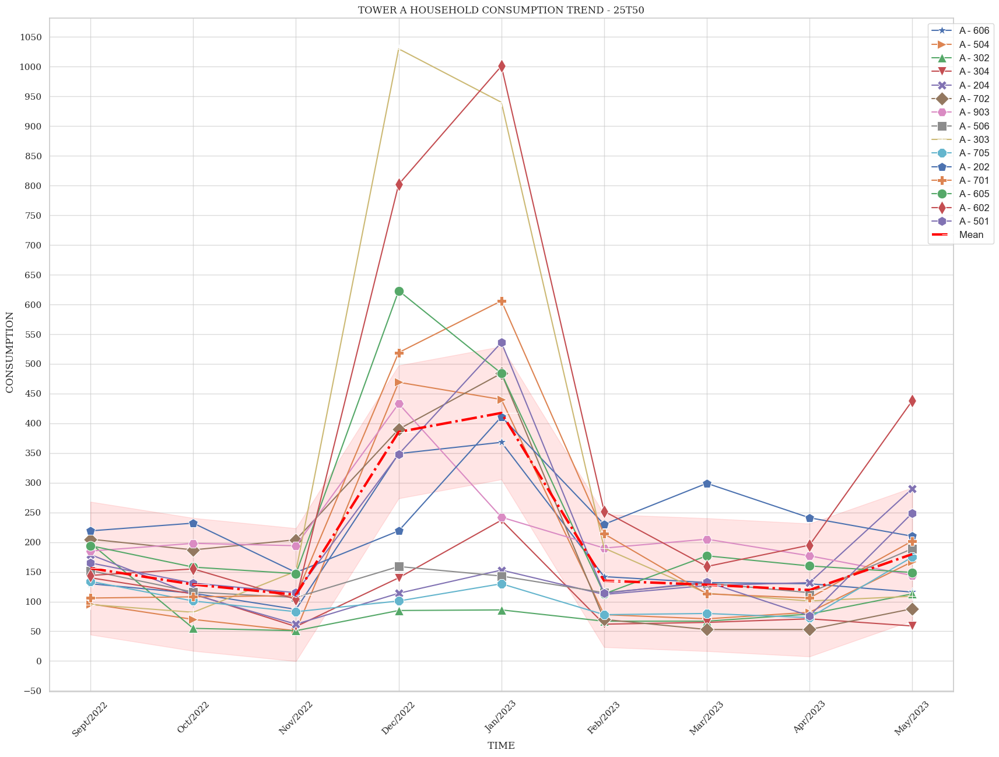

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


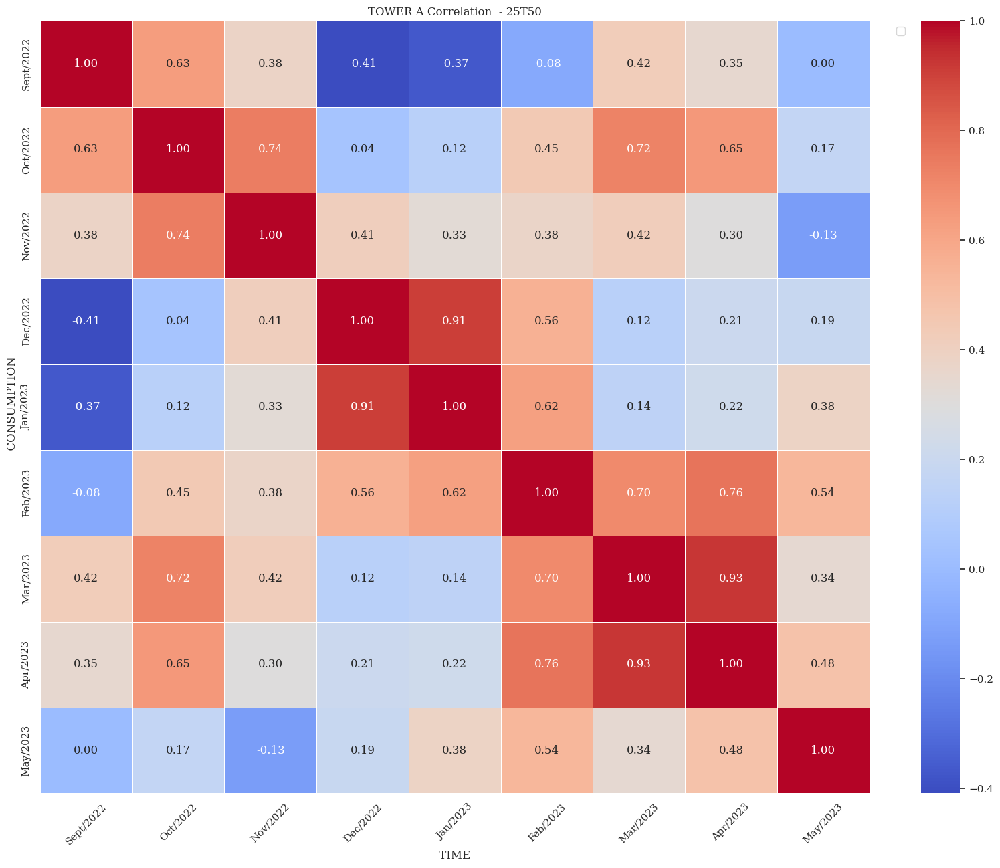

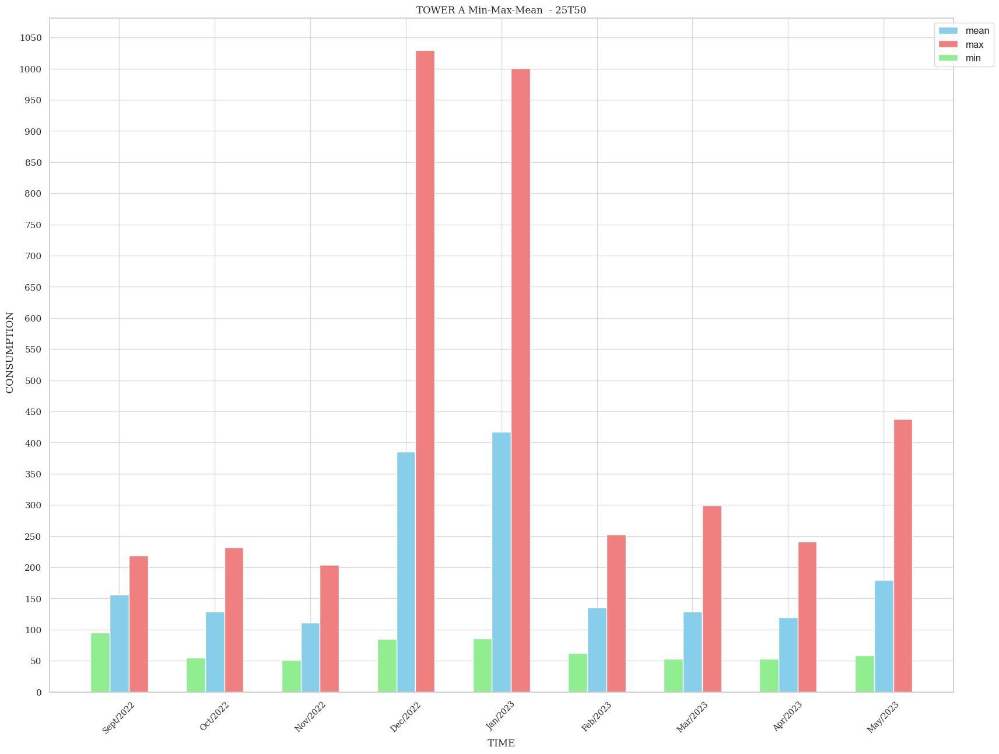

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


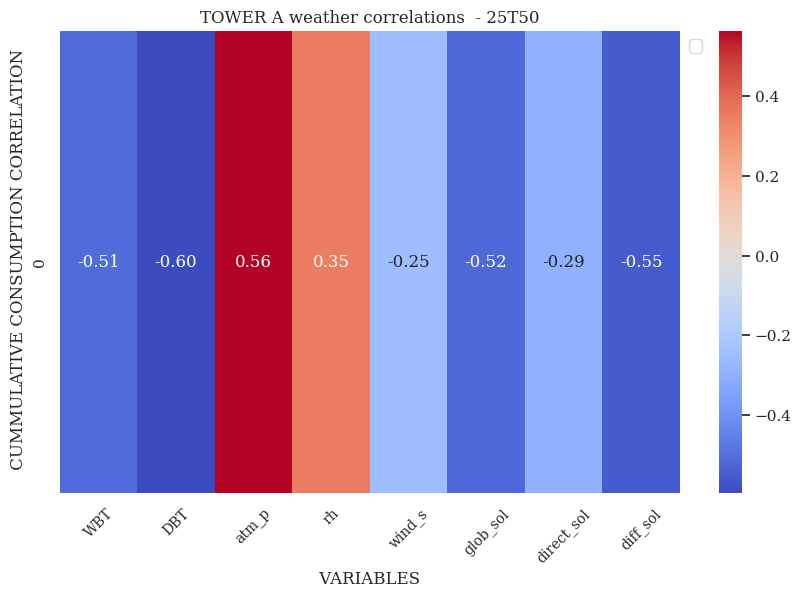

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

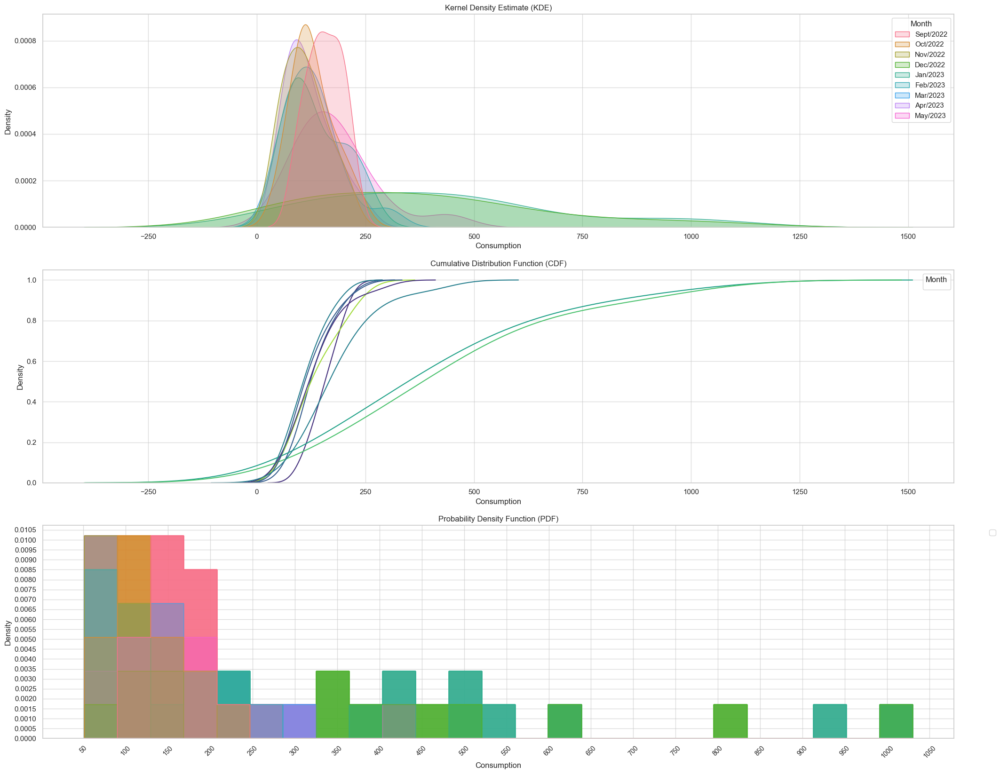

--------------------PLOT EXIT -------------------
house id  1


percentile is  0.55
50t75 mark chk


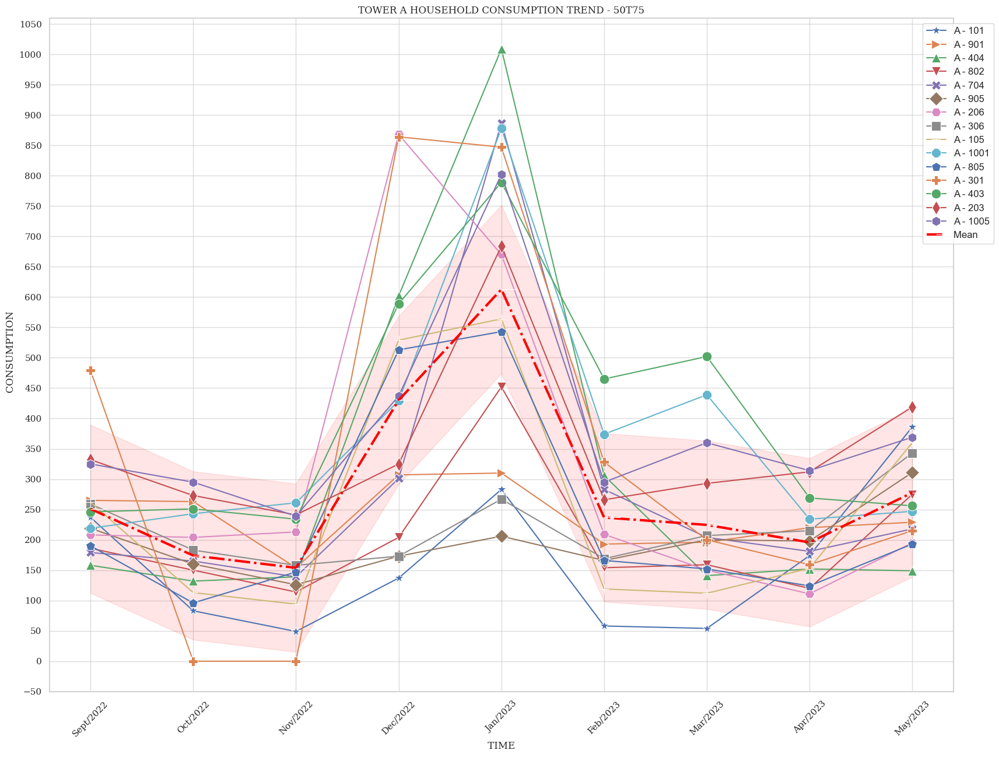

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


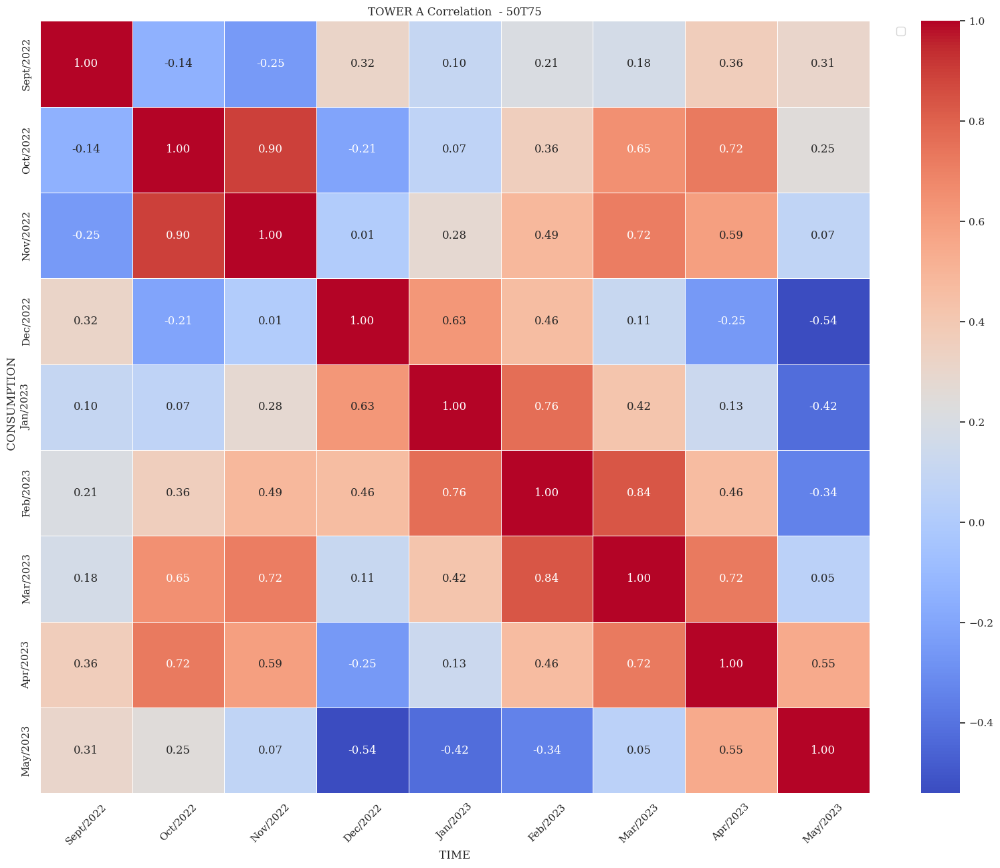

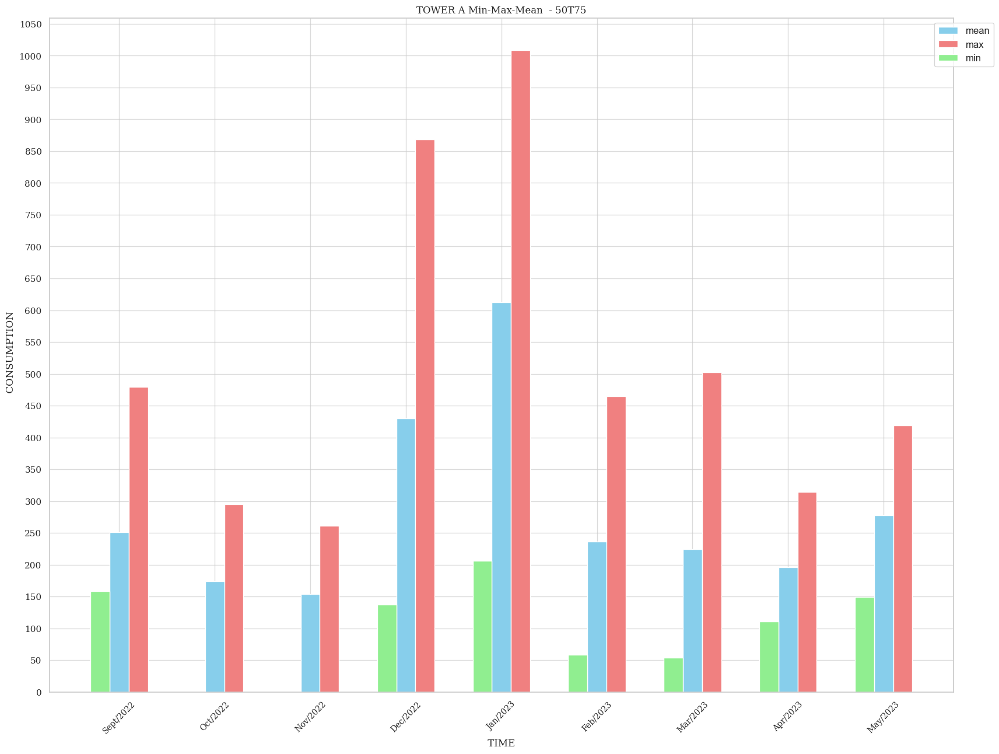

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


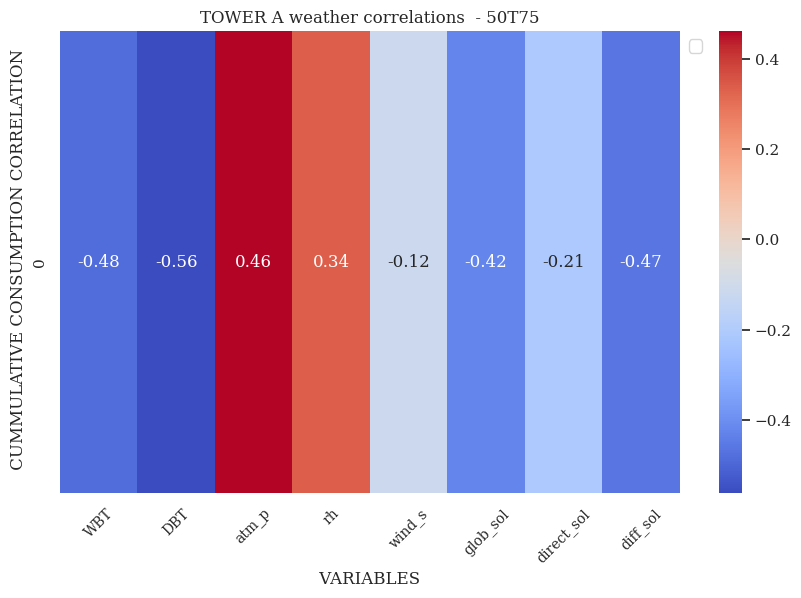

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

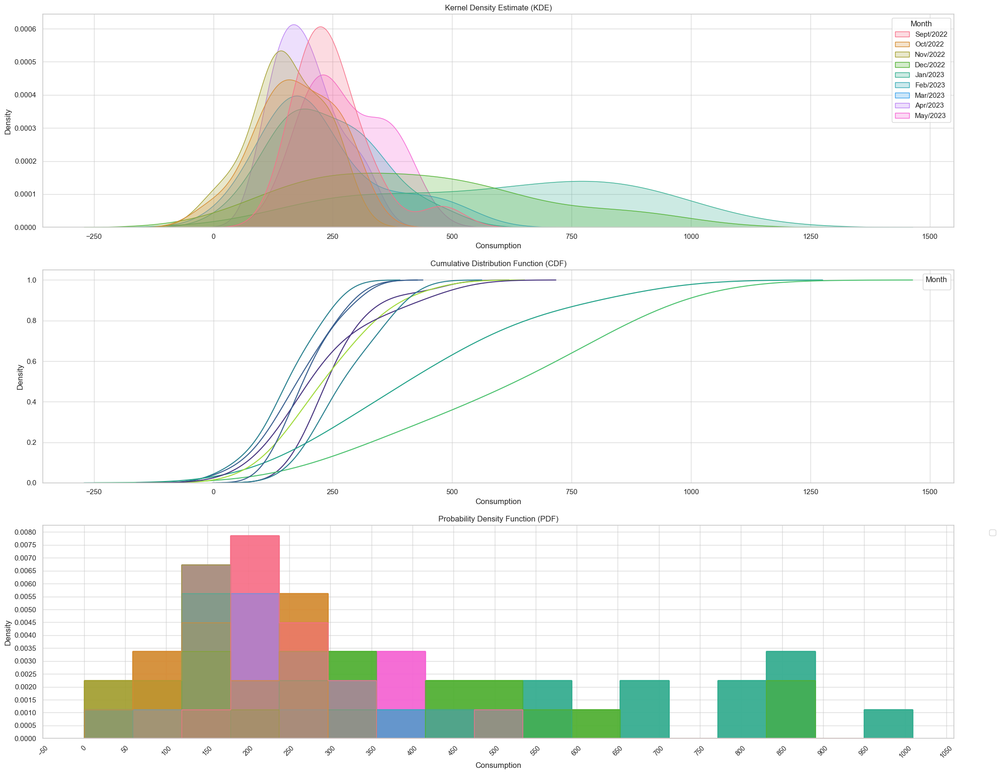

--------------------PLOT EXIT -------------------
house id  1


percentile is  0.8
75m mark chk


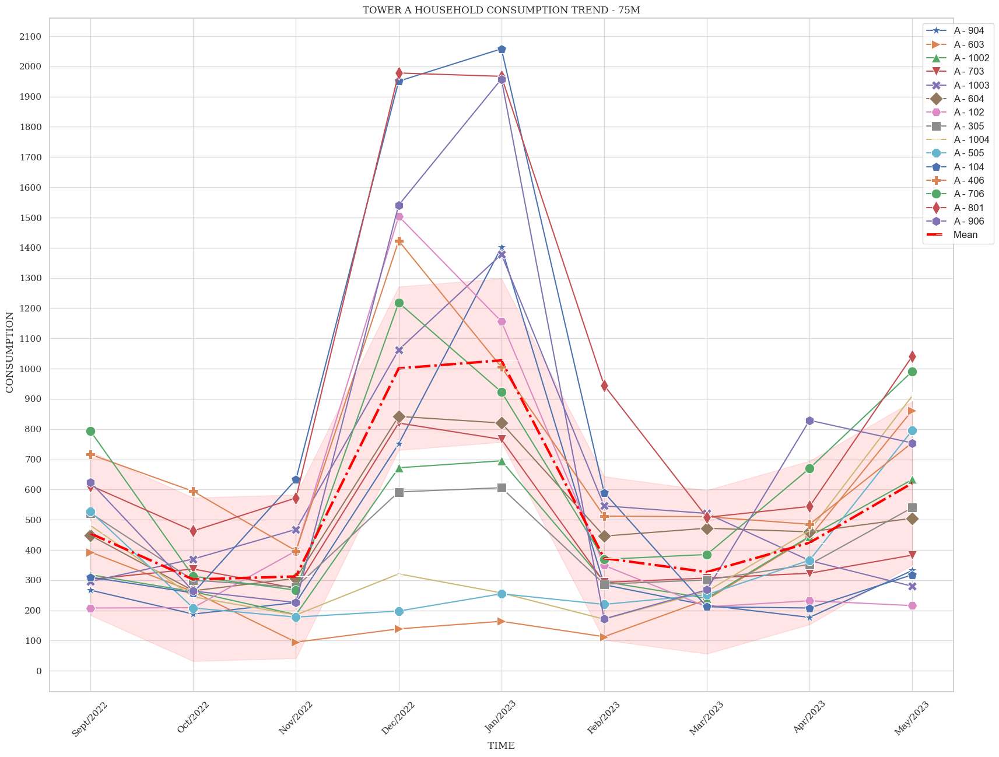

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


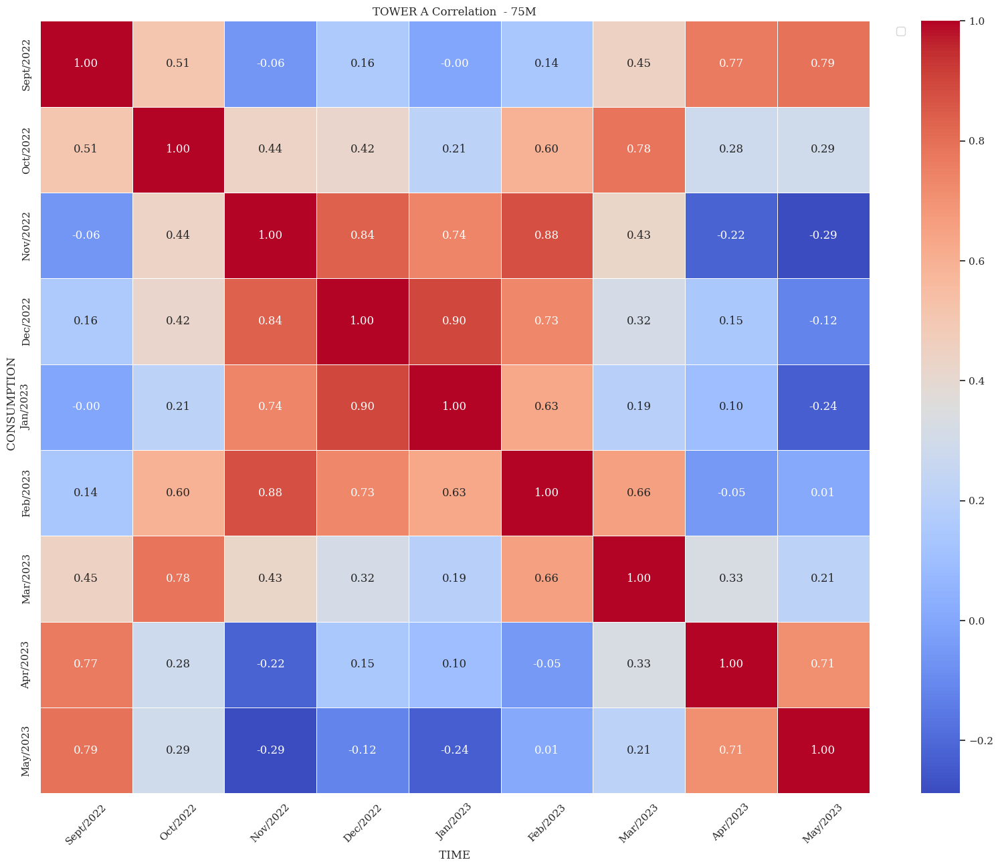

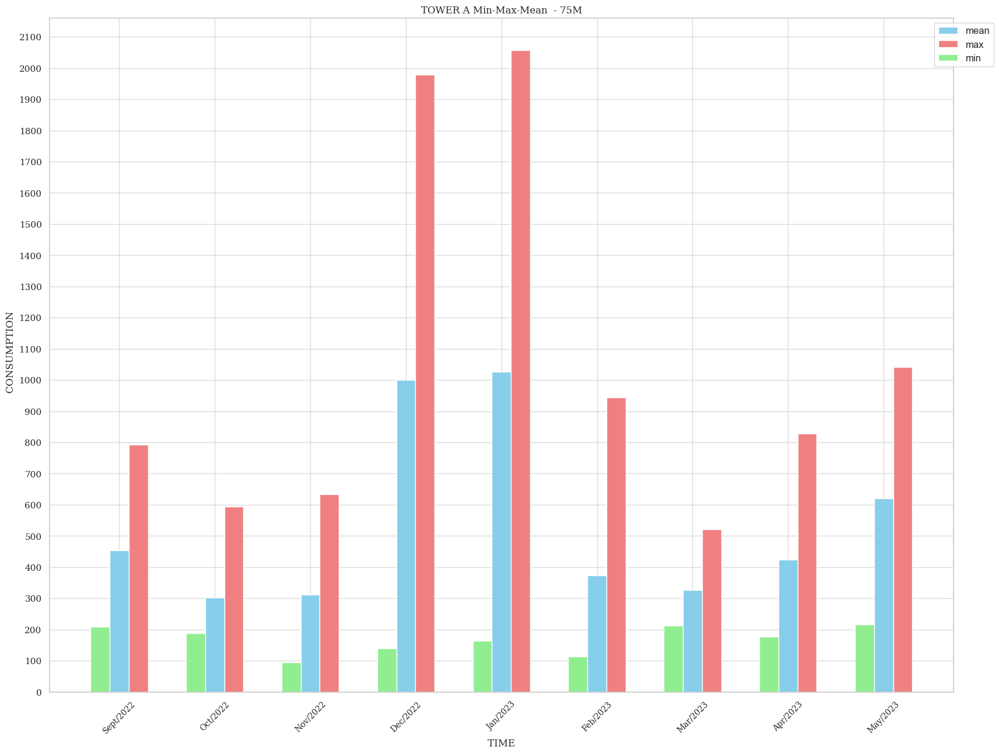

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


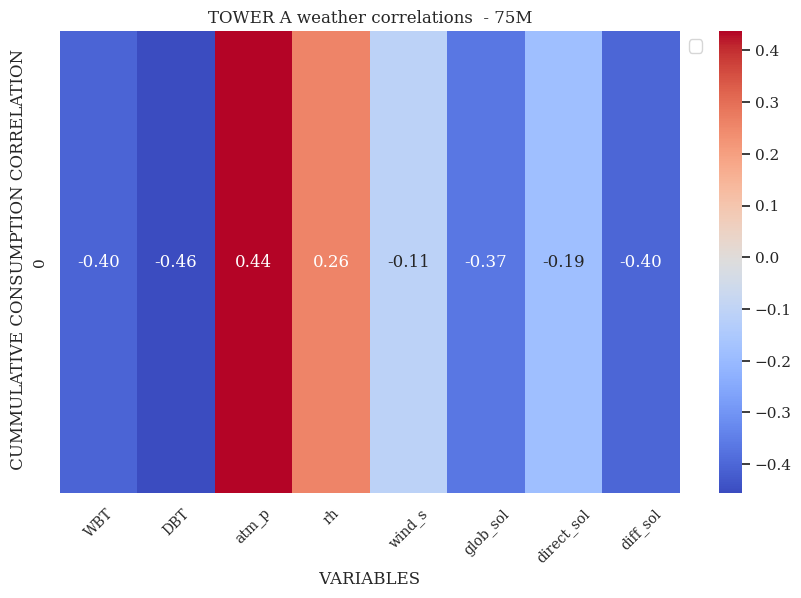

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

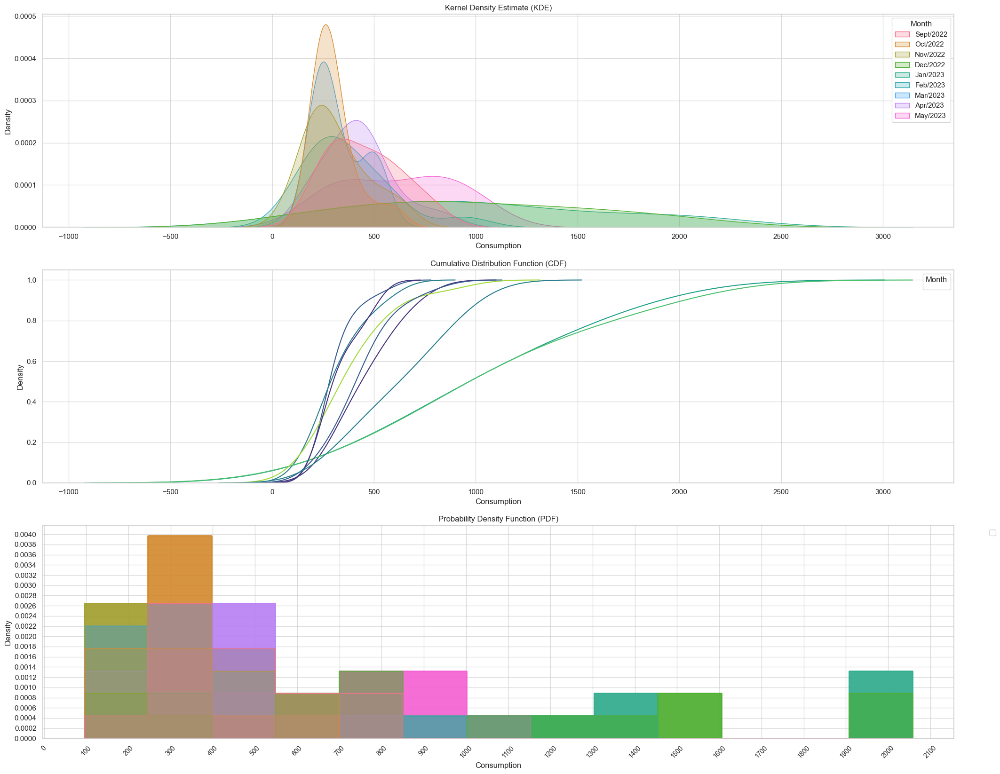

--------------------PLOT EXIT -------------------
house id  2


percentile is  0.05
l25 mark chk


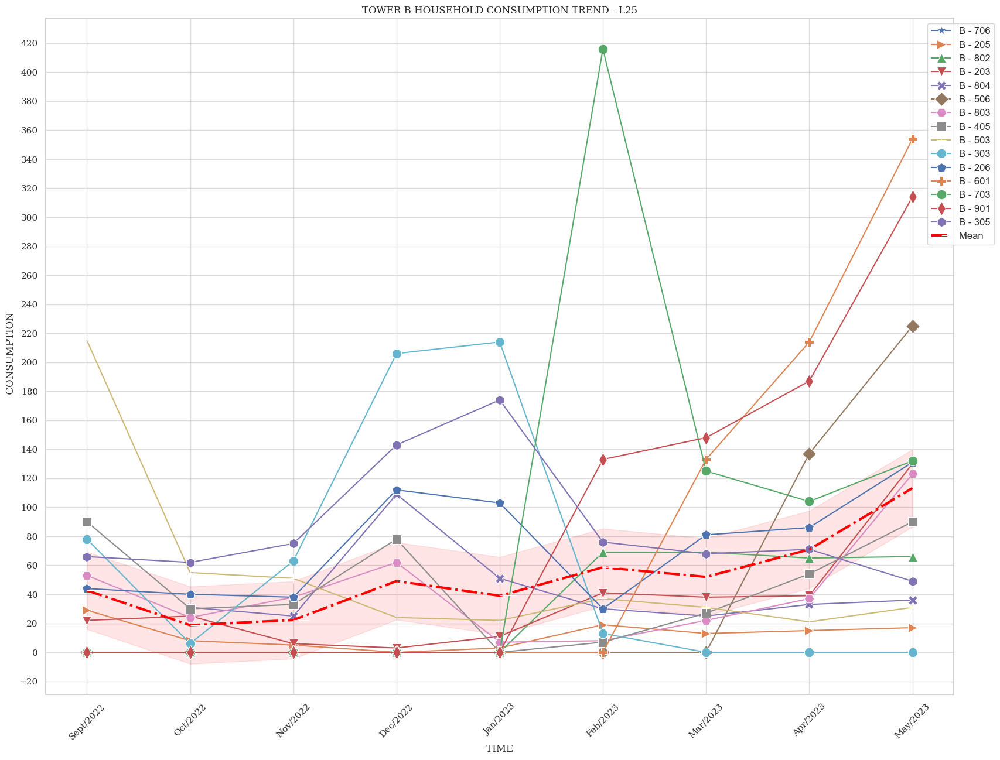

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


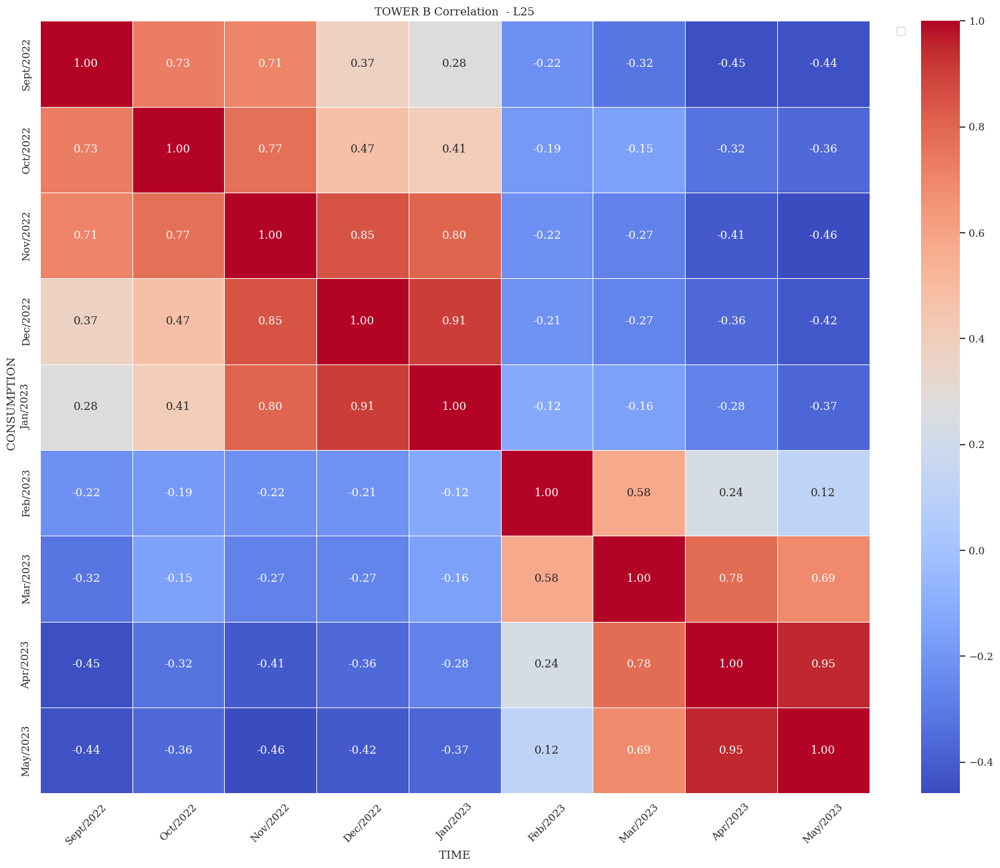

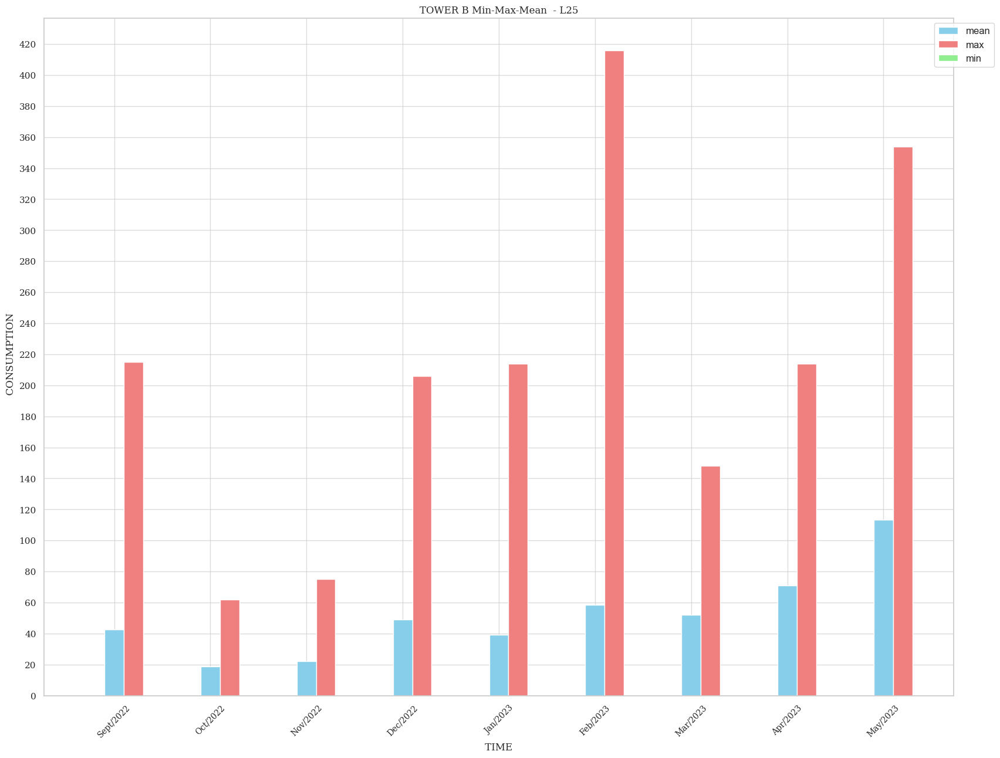

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


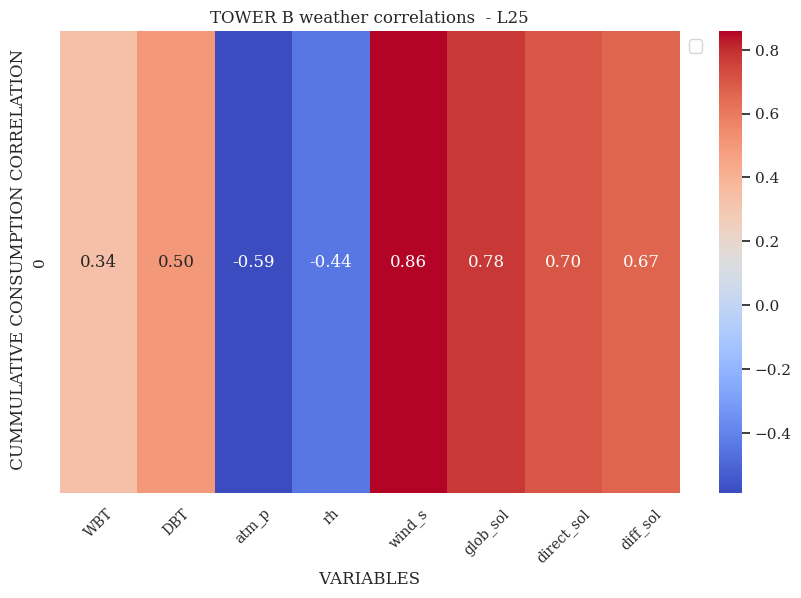

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

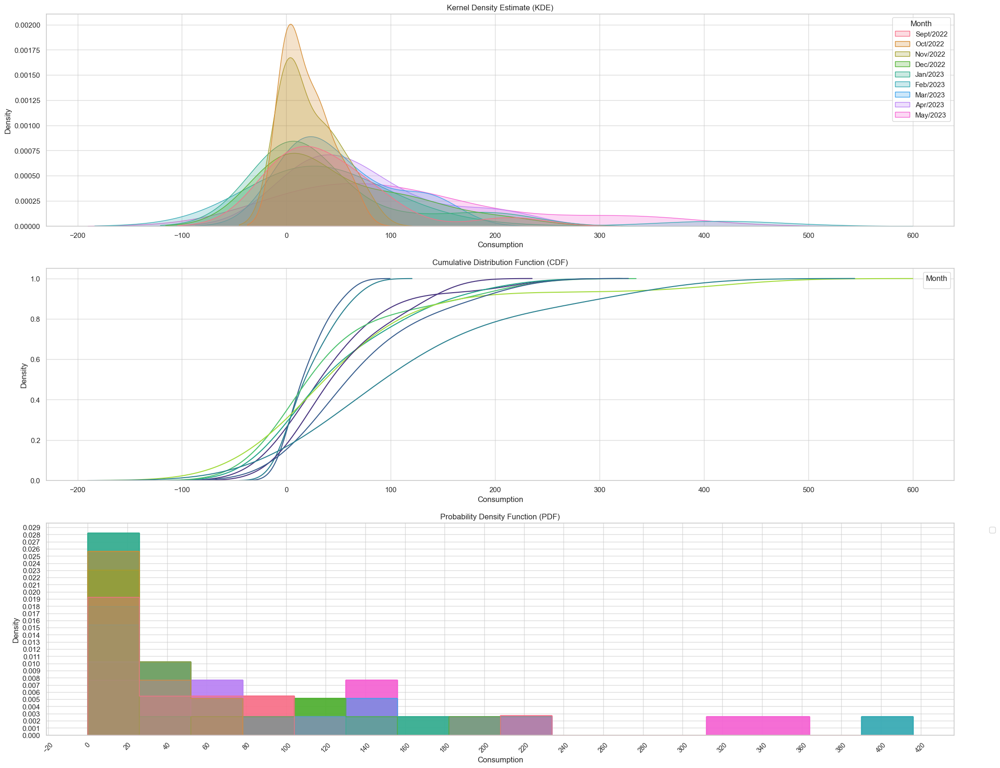

--------------------PLOT EXIT -------------------
house id  2


percentile is  0.3
25t50 mark chk


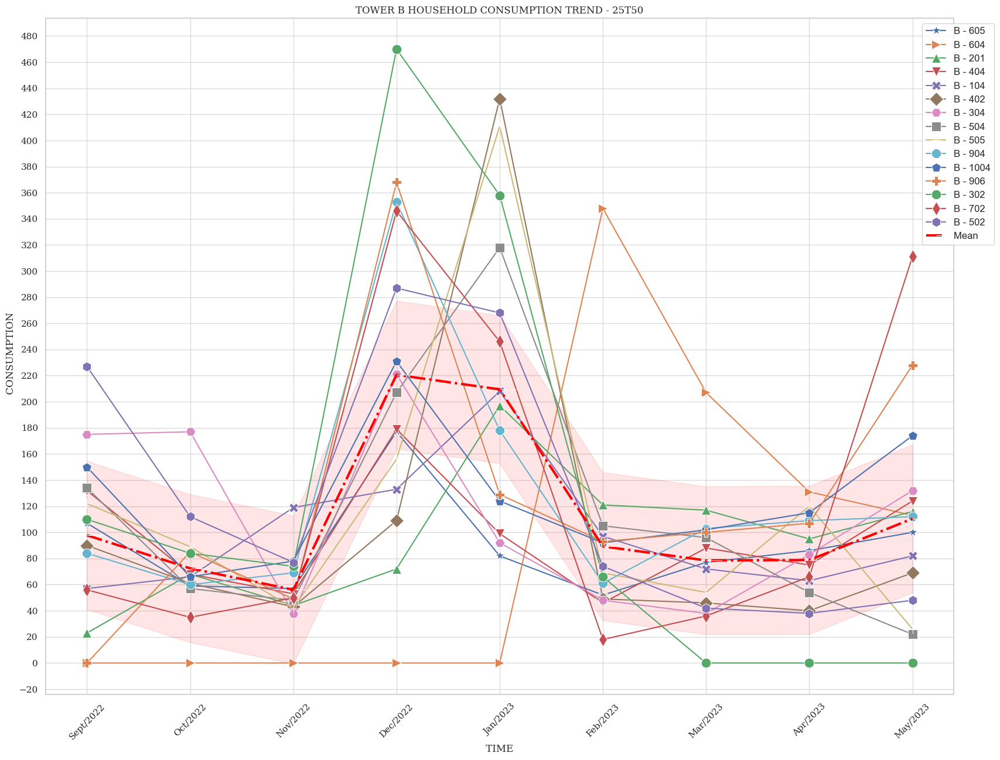

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


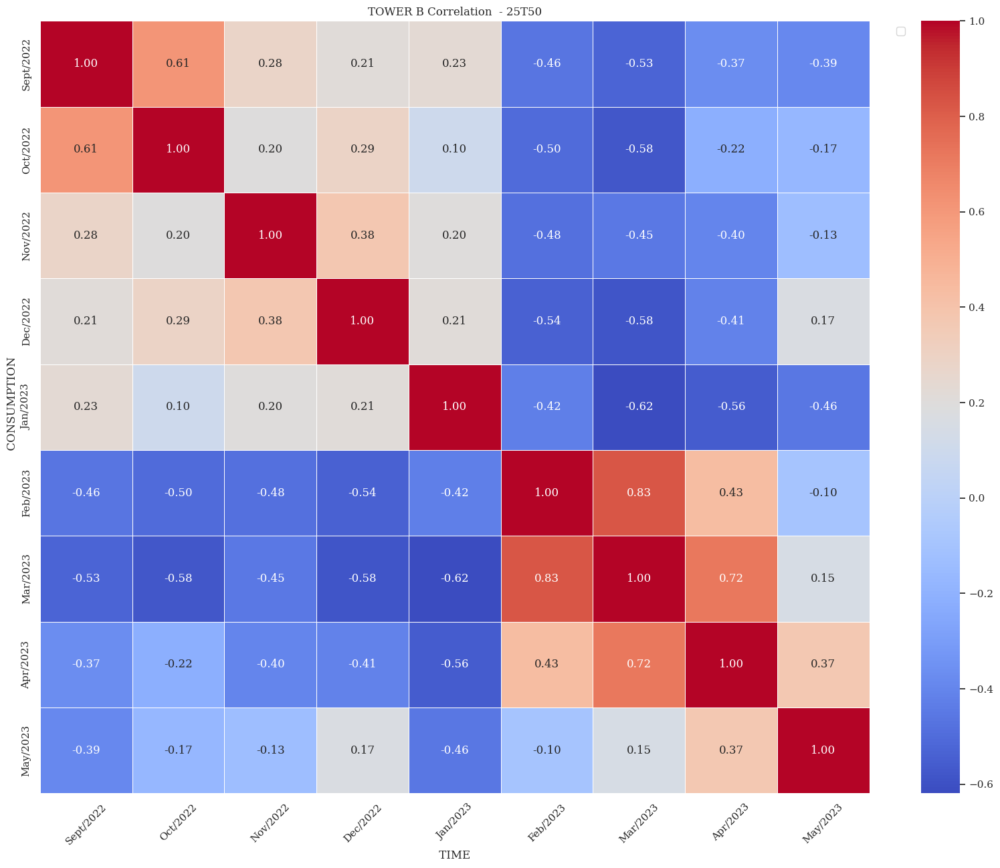

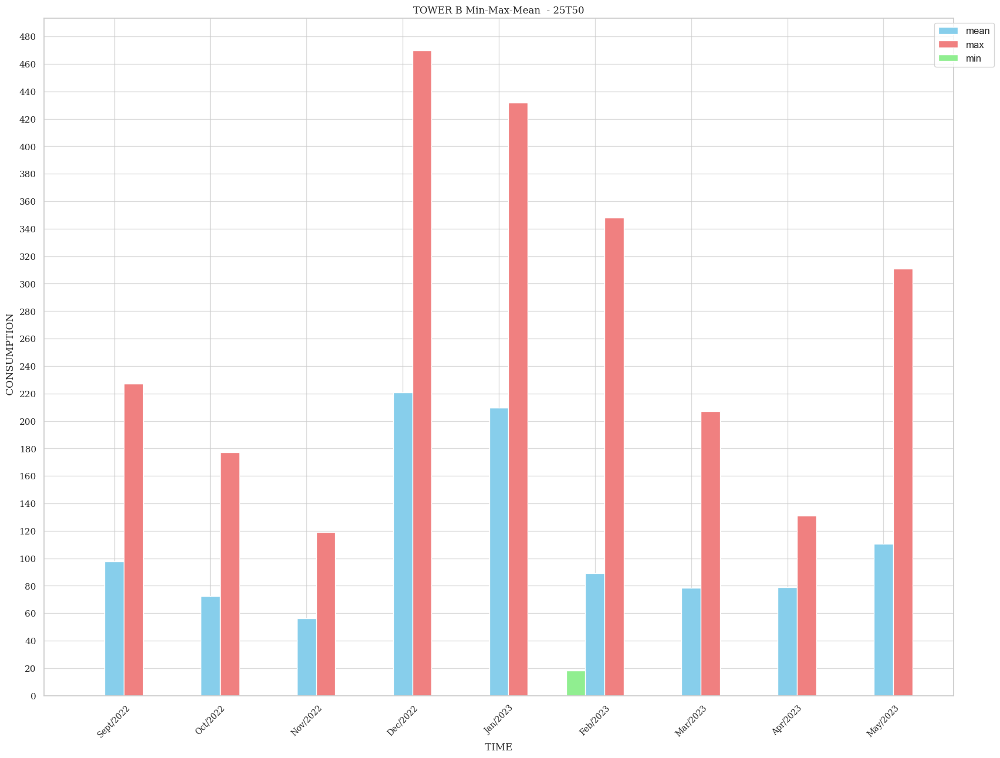

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


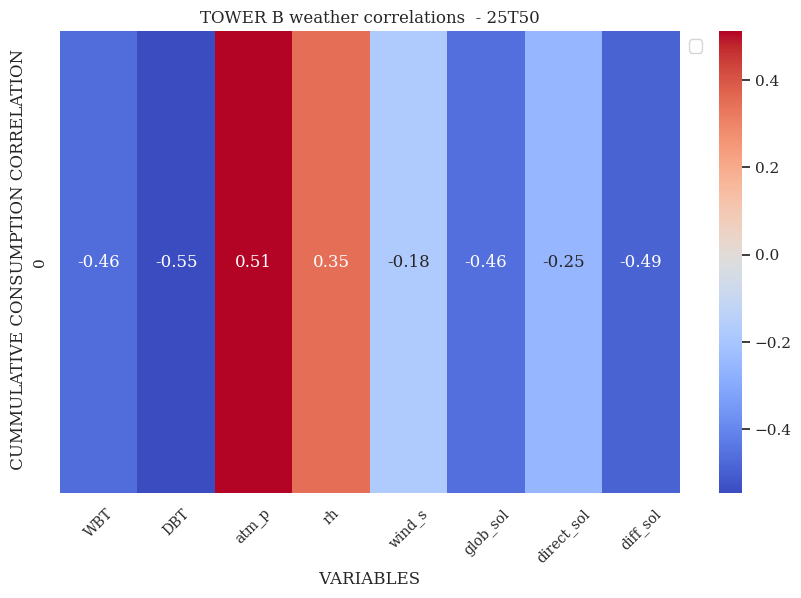

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

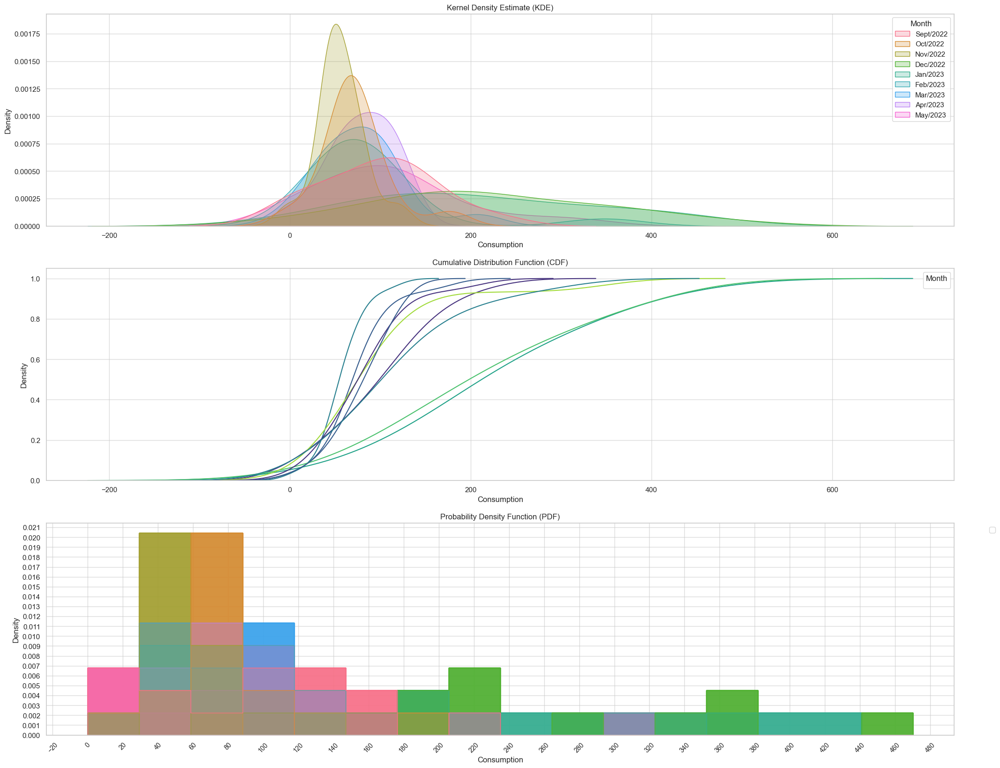

--------------------PLOT EXIT -------------------
house id  2


percentile is  0.55
50t75 mark chk


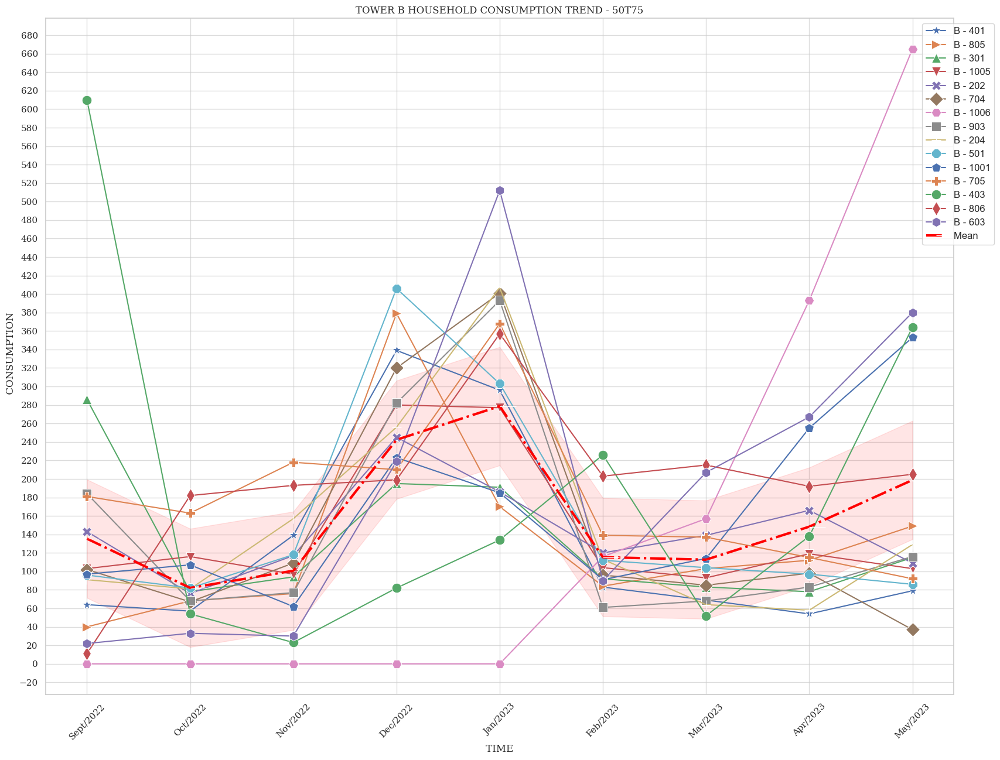

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


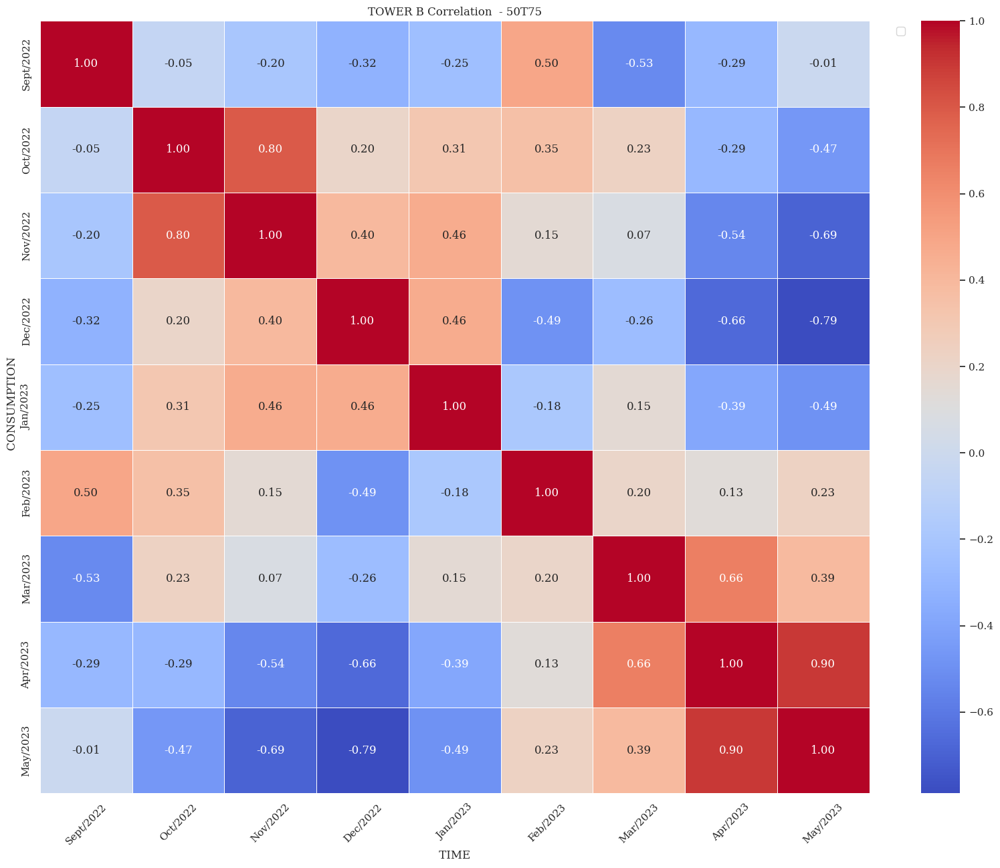

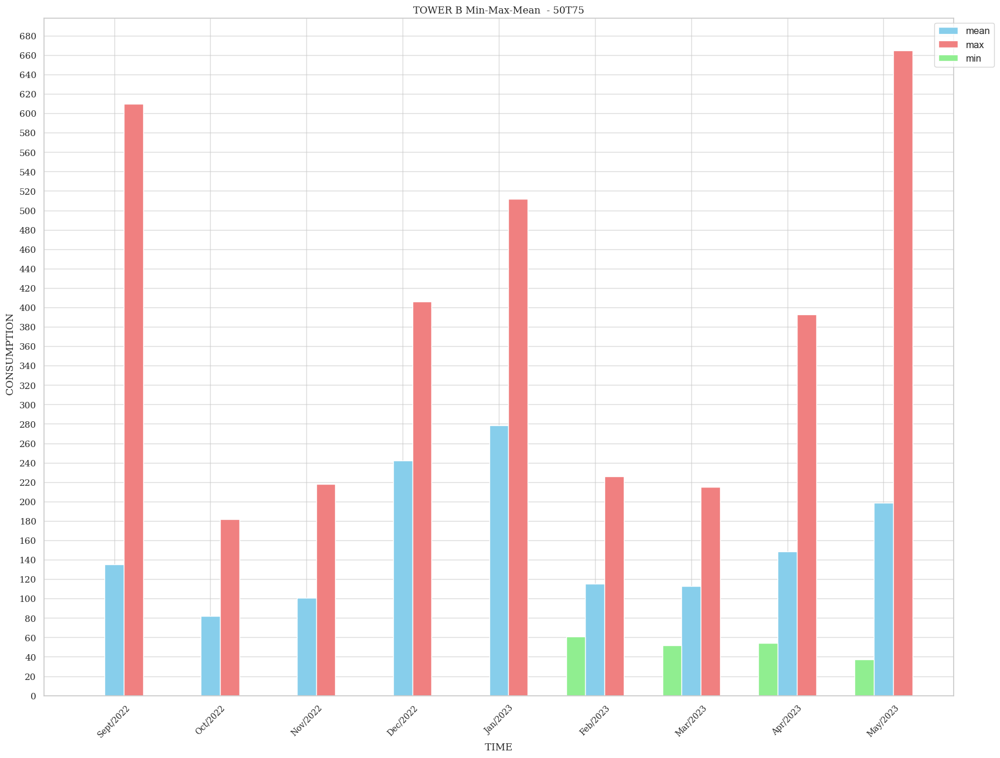

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


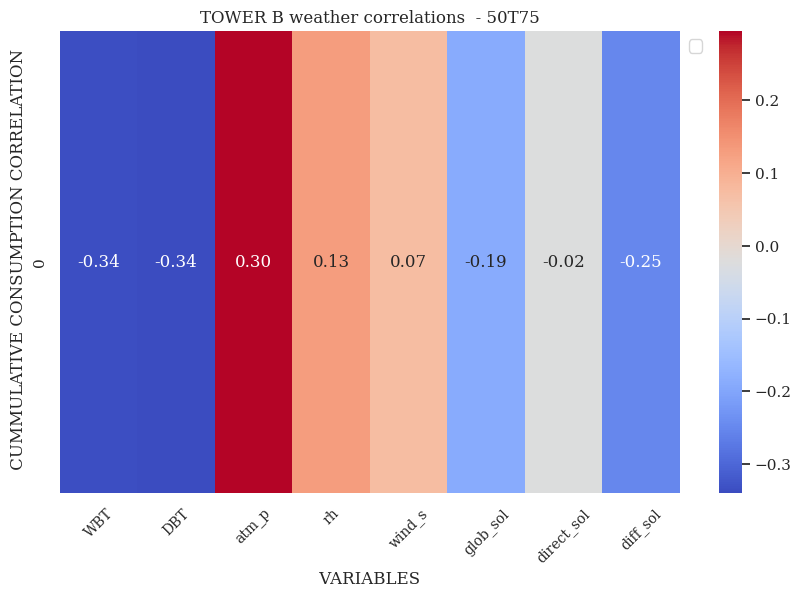

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

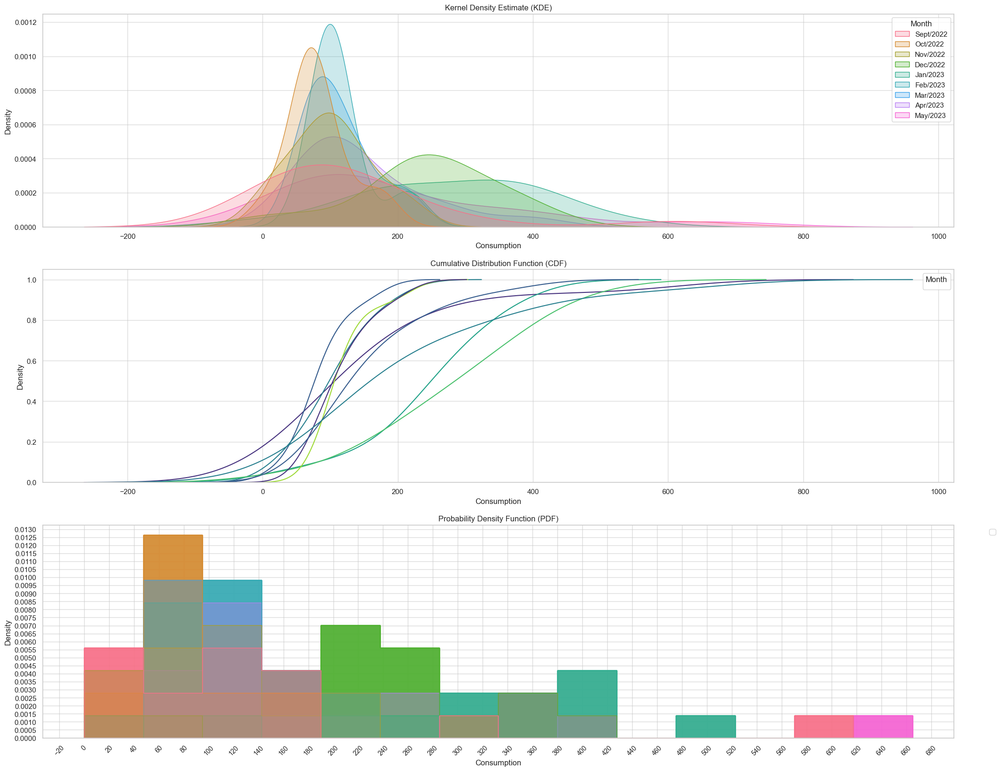

--------------------PLOT EXIT -------------------
house id  2


percentile is  0.8
75m mark chk


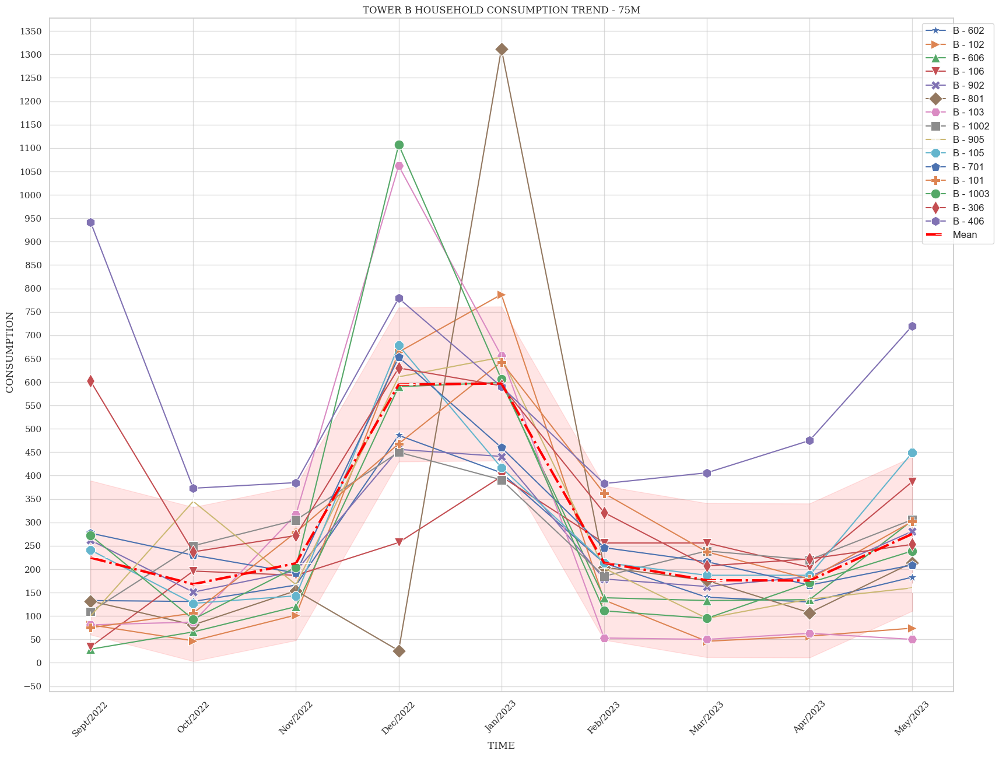

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


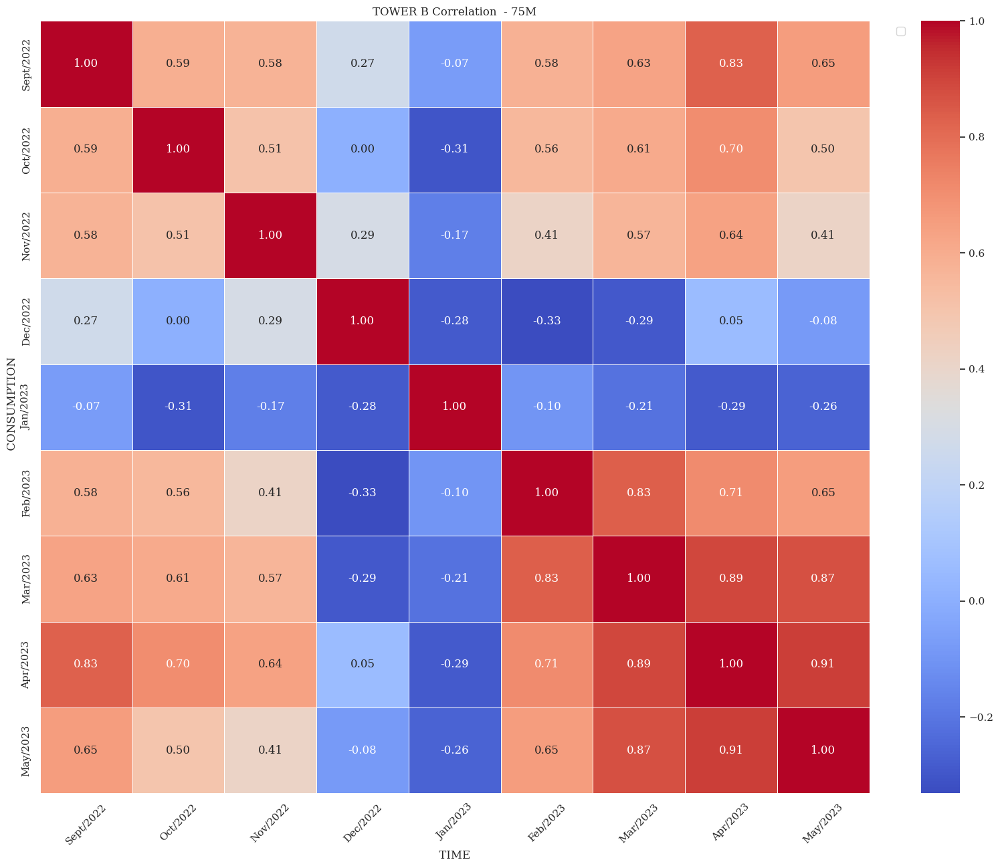

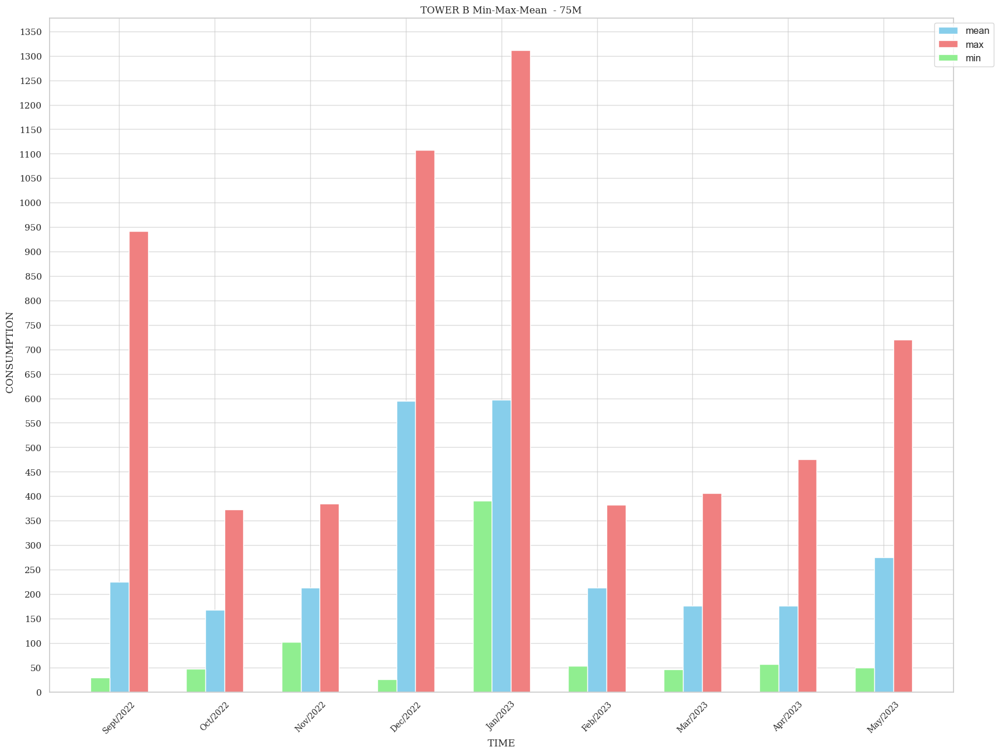

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


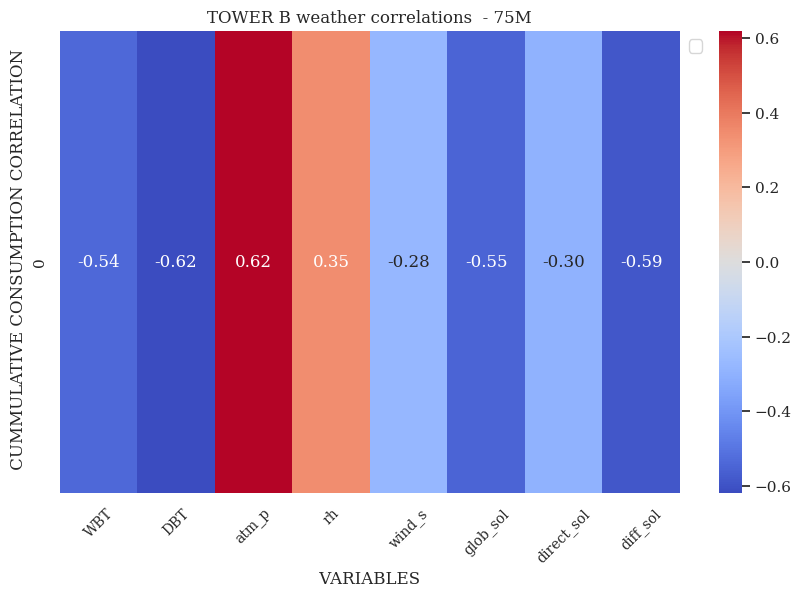

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

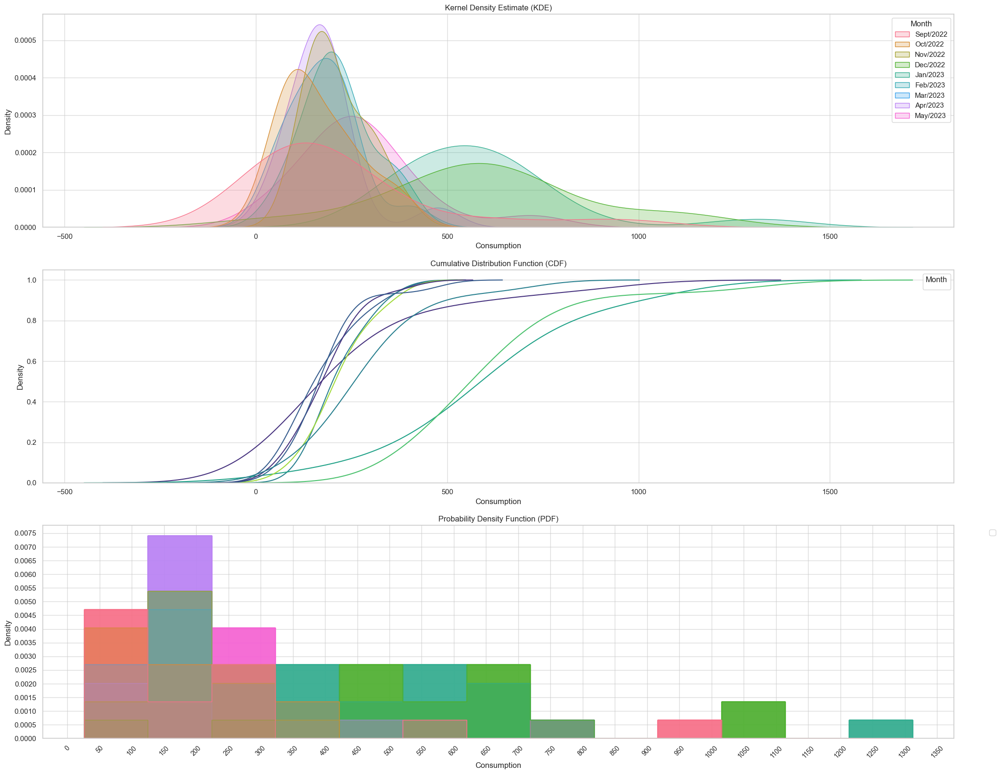

--------------------PLOT EXIT -------------------
house id  3


percentile is  0.05
l25 mark chk


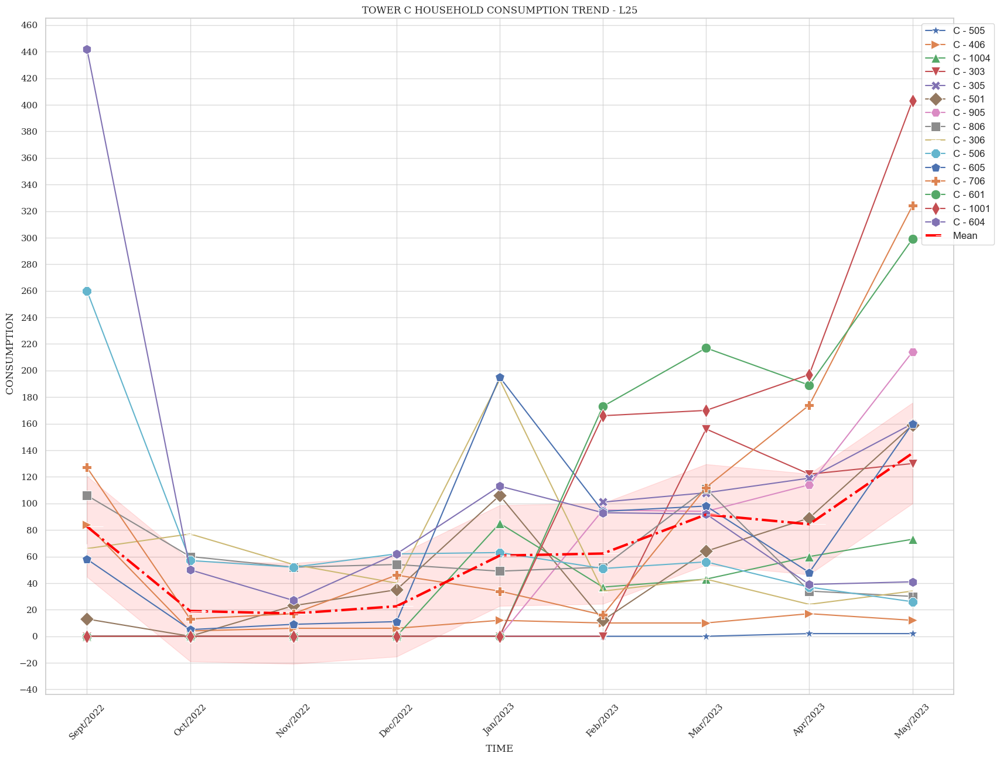

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


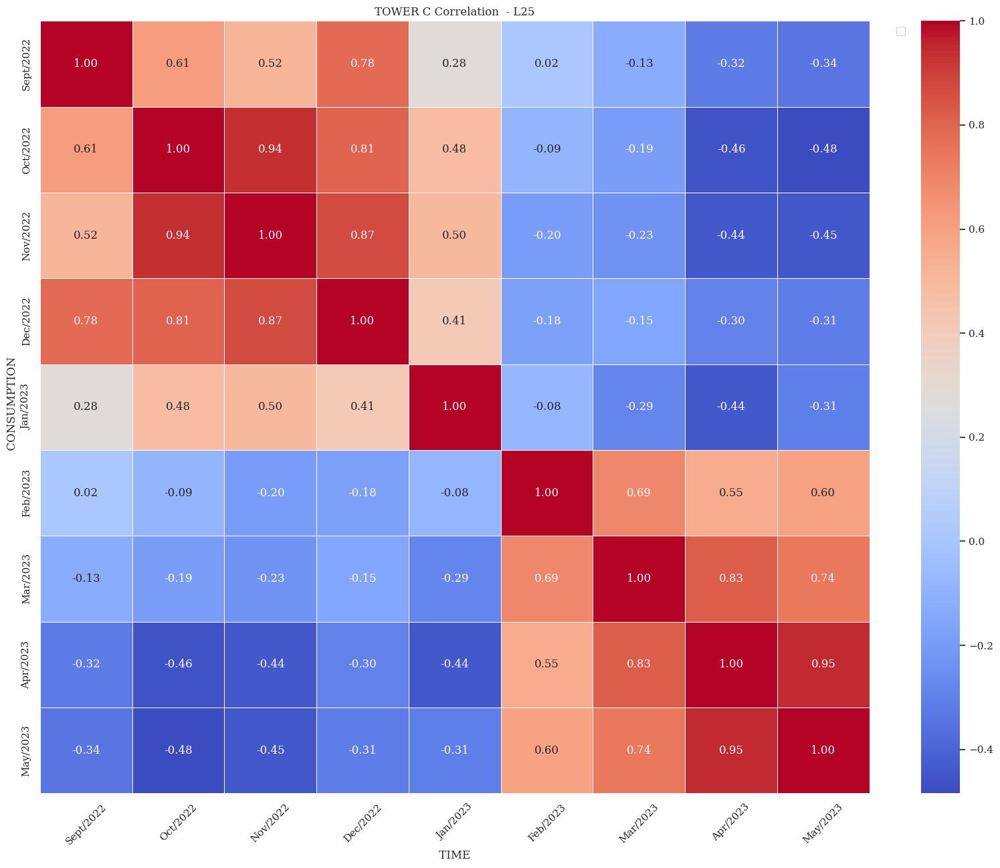

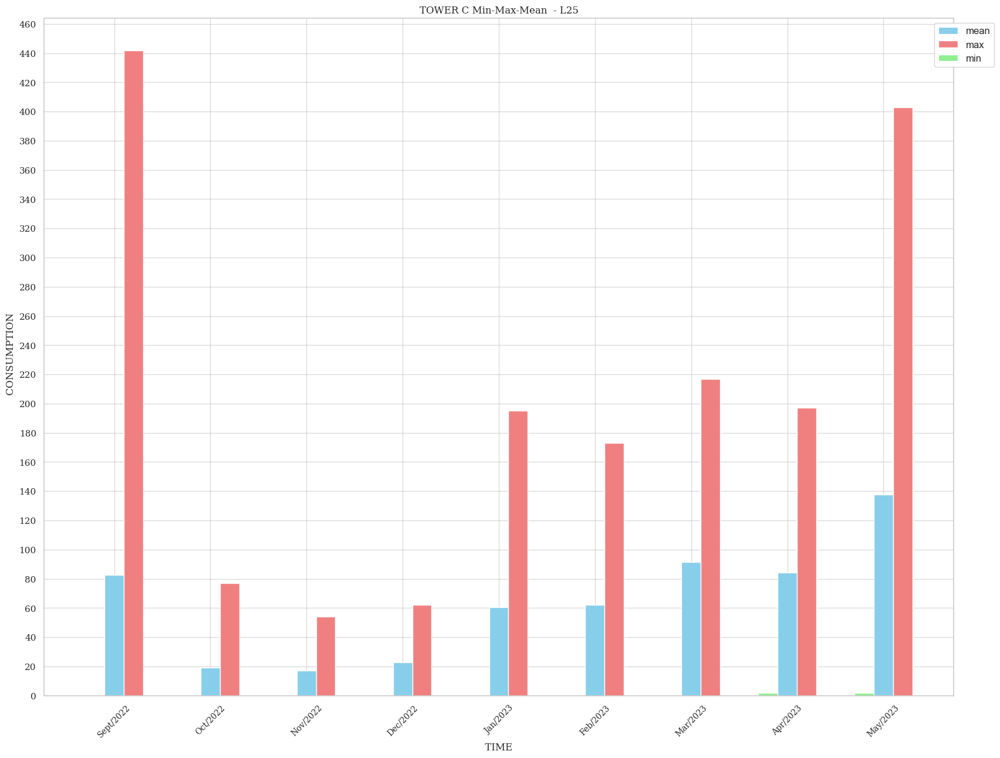

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


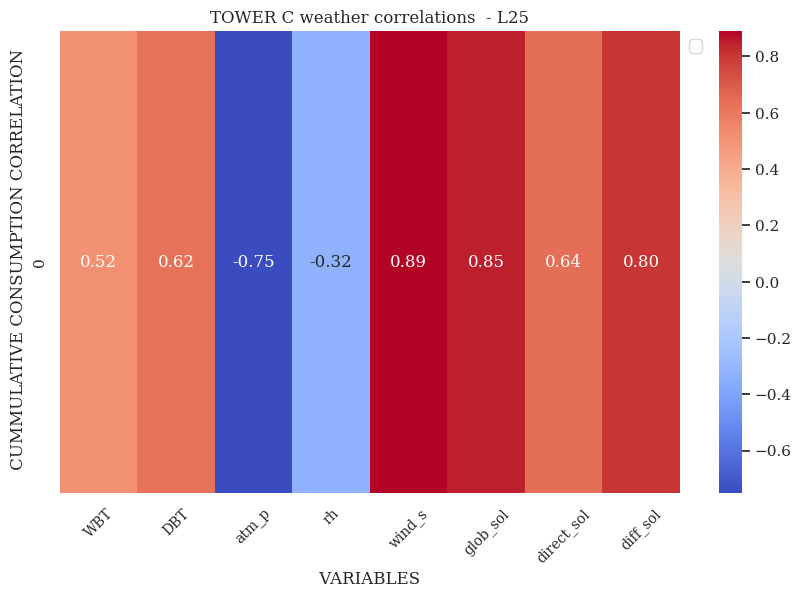

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

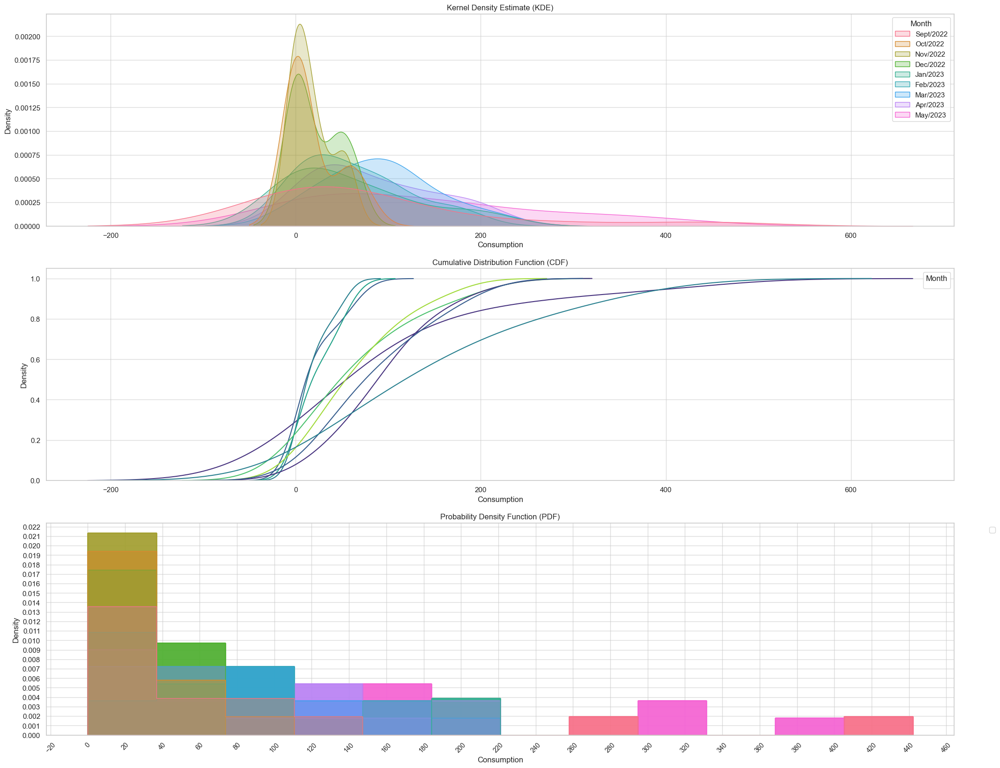

--------------------PLOT EXIT -------------------
house id  3


percentile is  0.3
25t50 mark chk


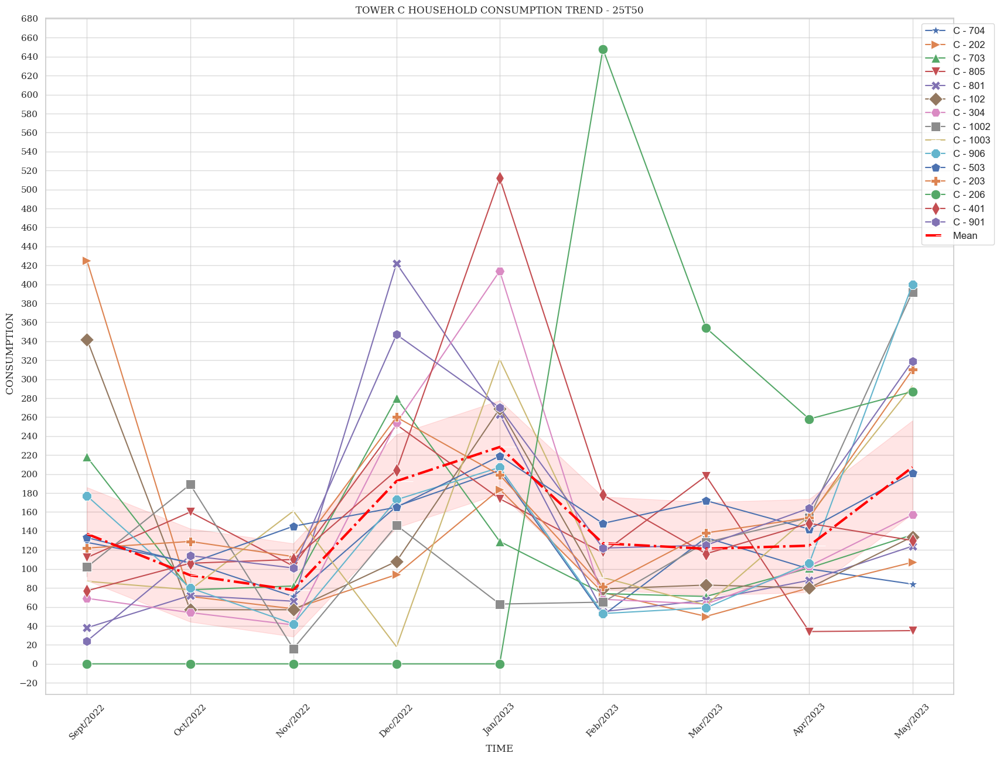

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


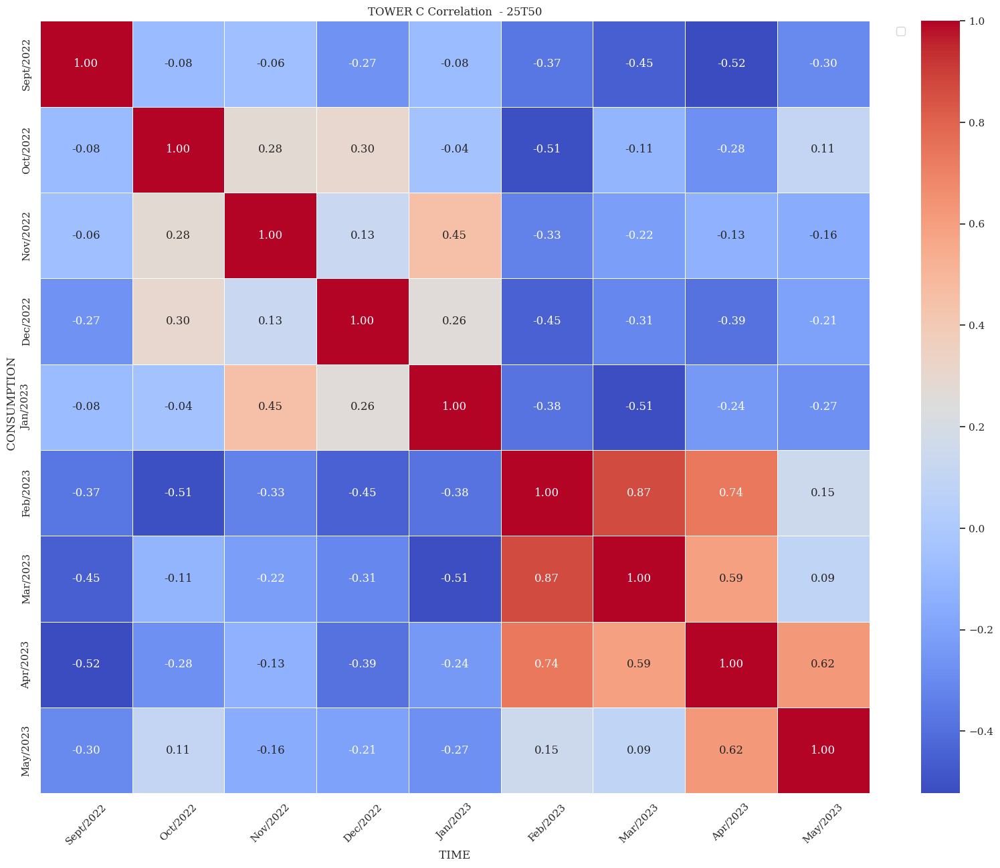

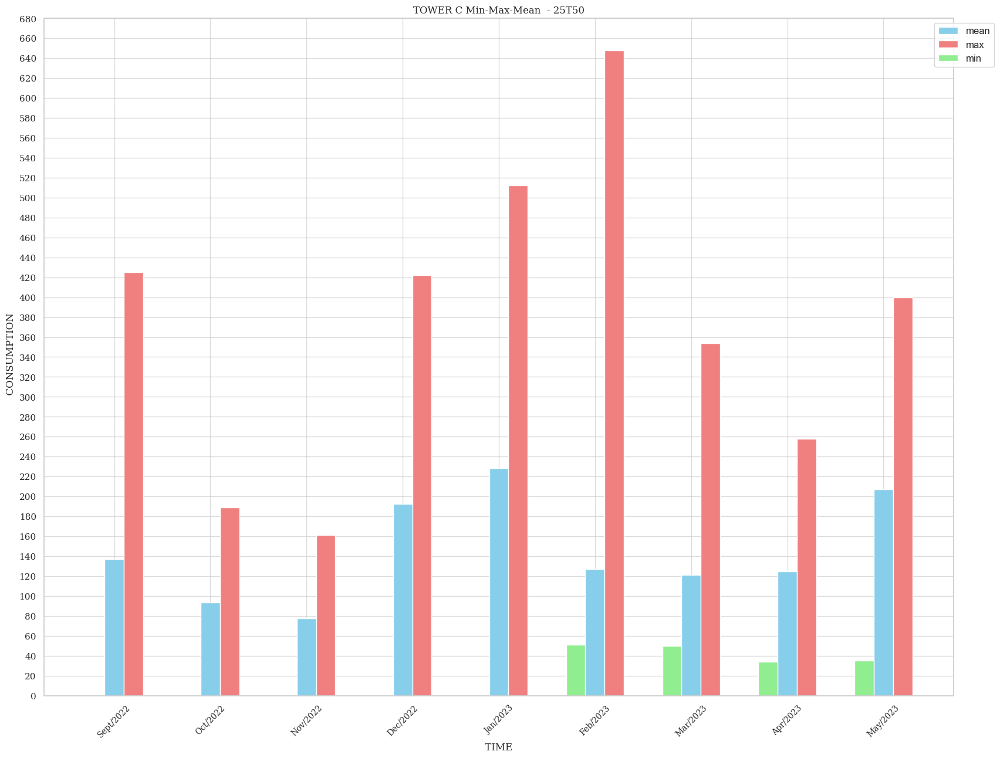

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


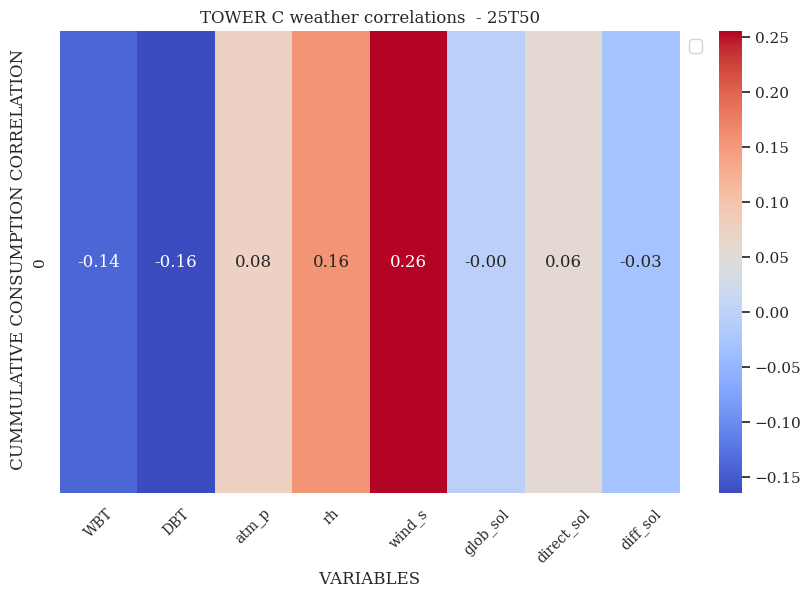

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

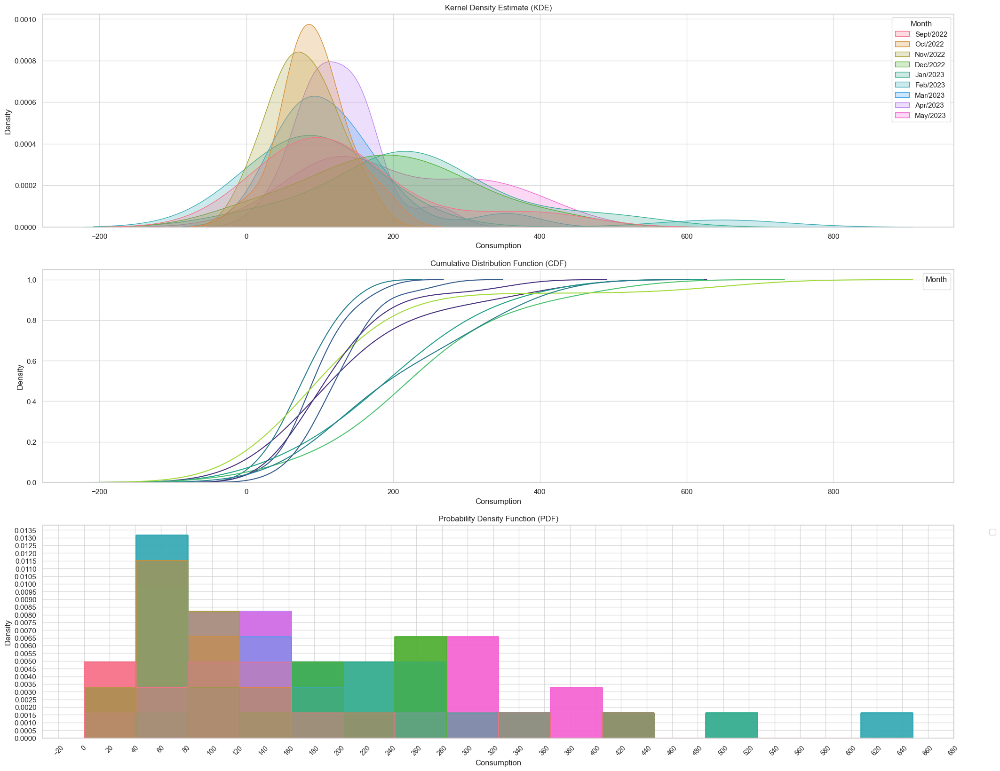

--------------------PLOT EXIT -------------------
house id  3


percentile is  0.55
50t75 mark chk


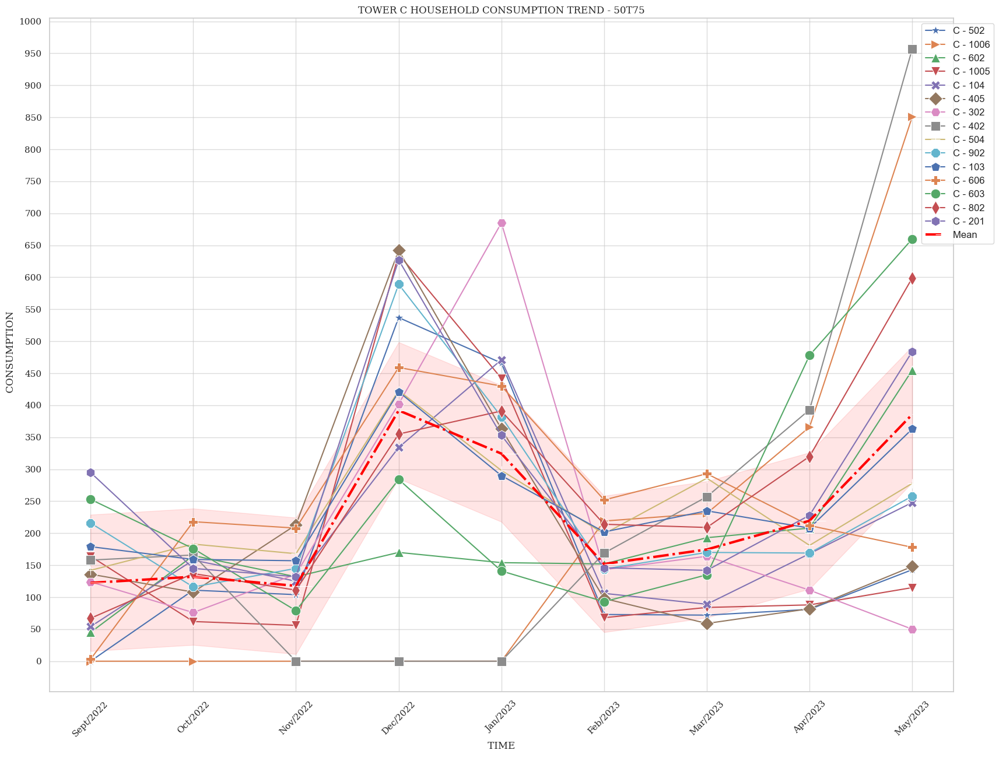

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


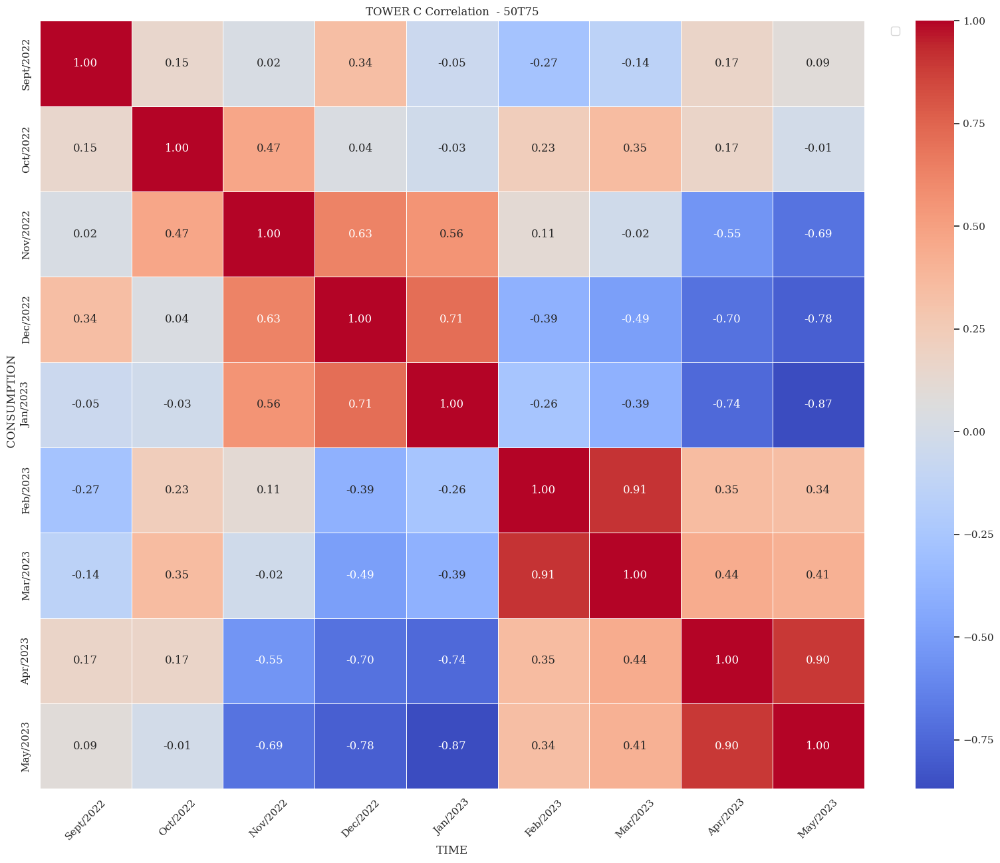

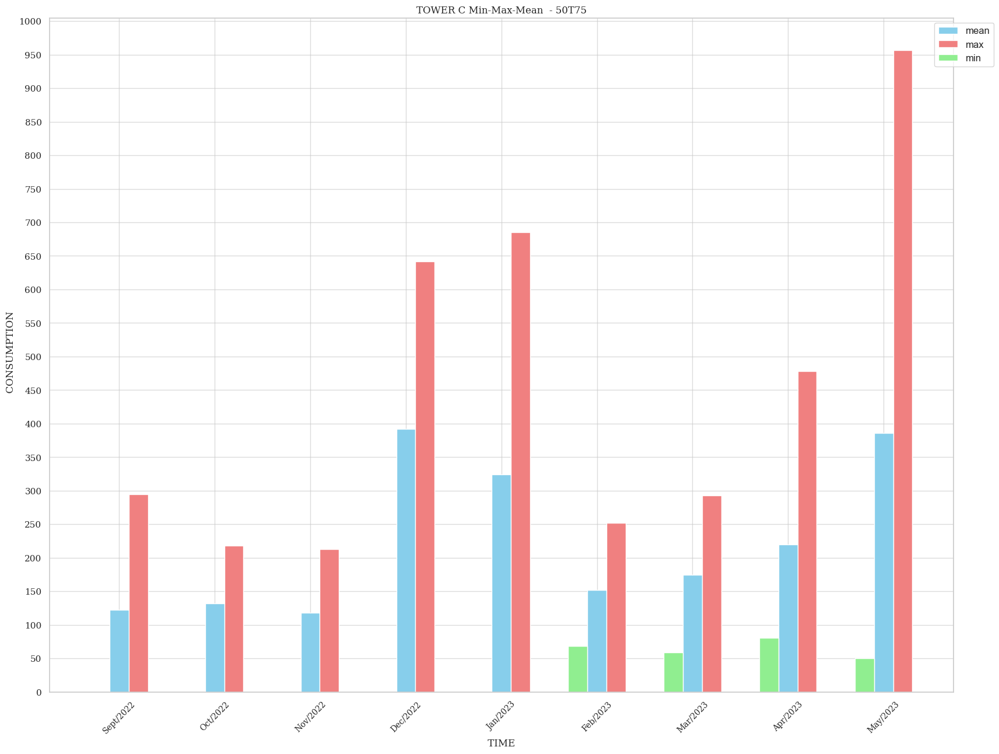

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


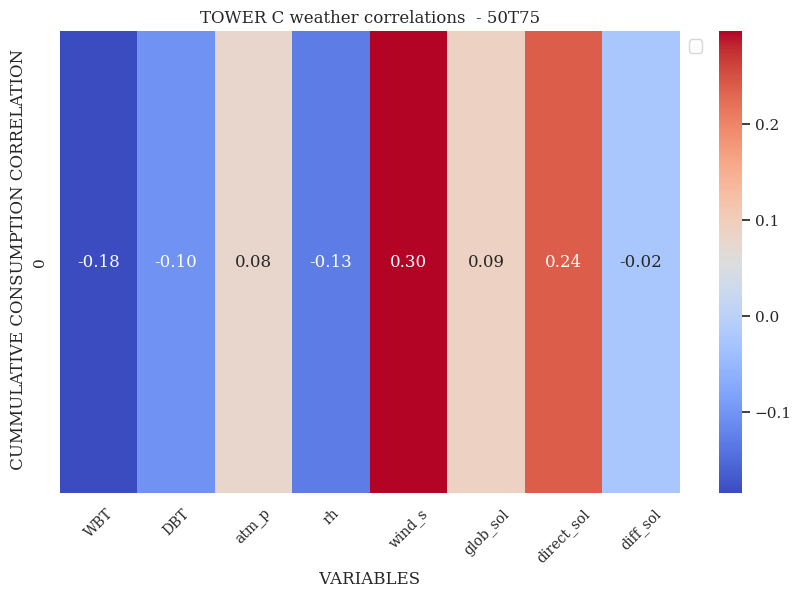

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

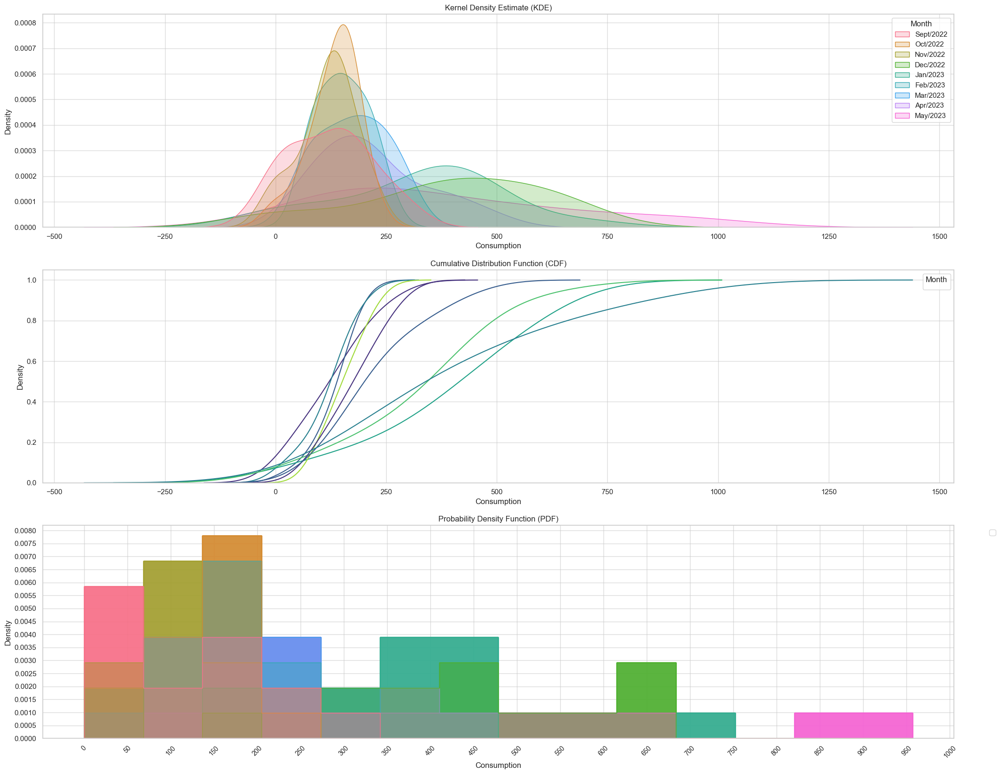

--------------------PLOT EXIT -------------------
house id  3


percentile is  0.8
75m mark chk


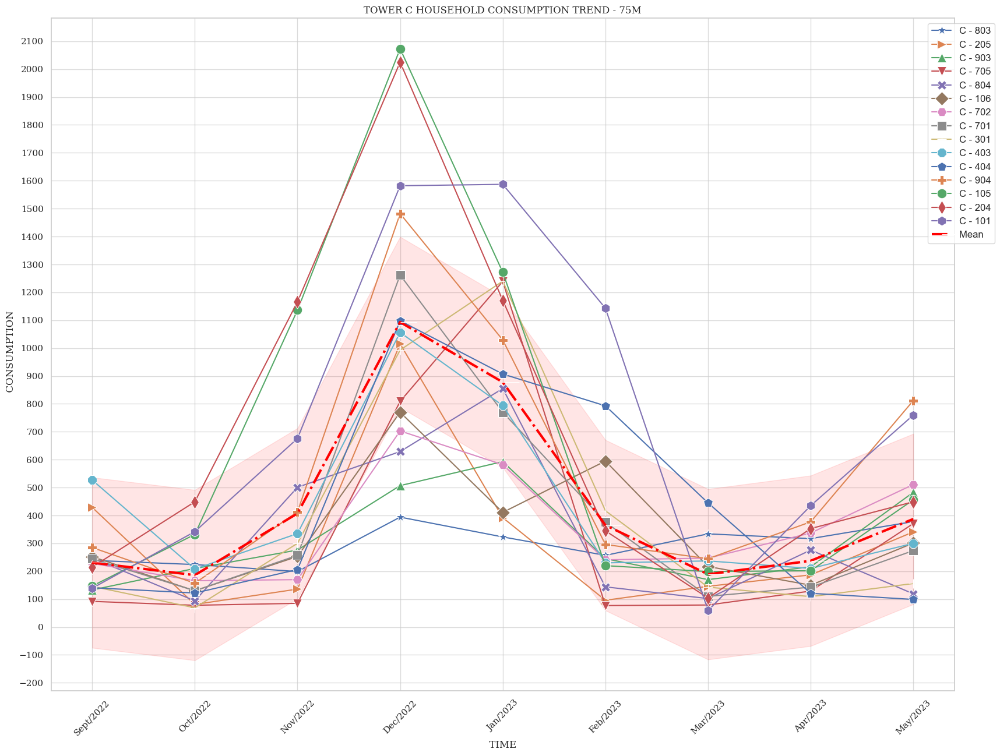

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


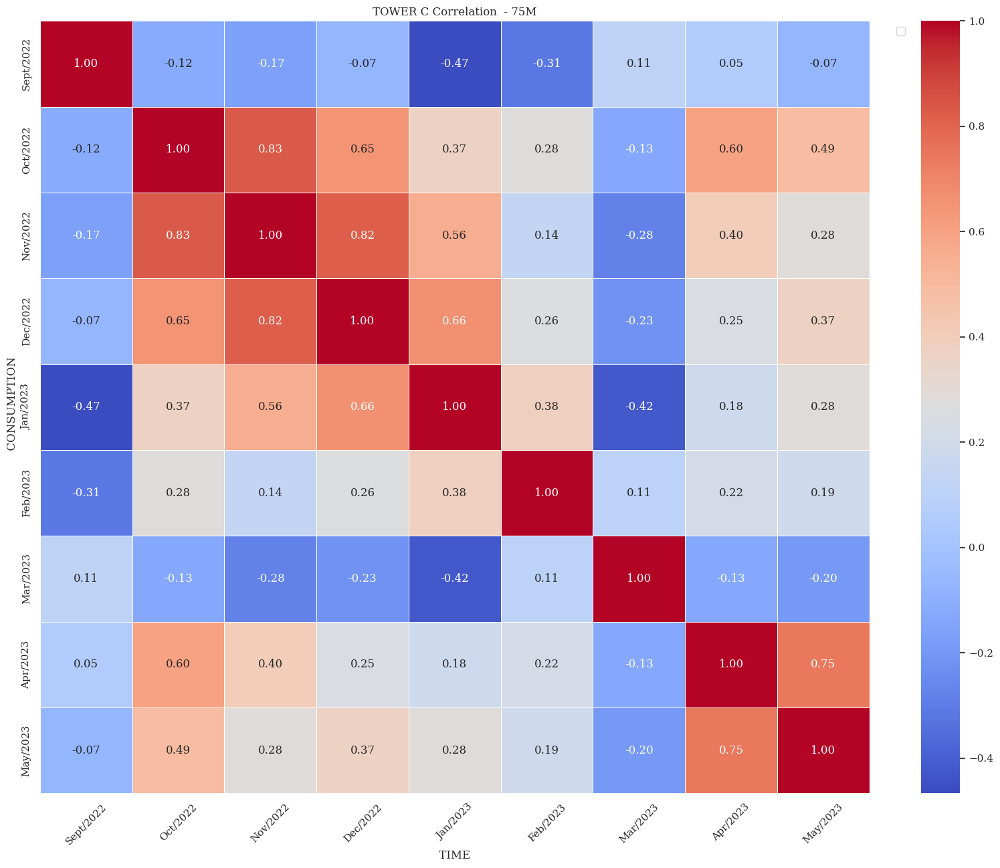

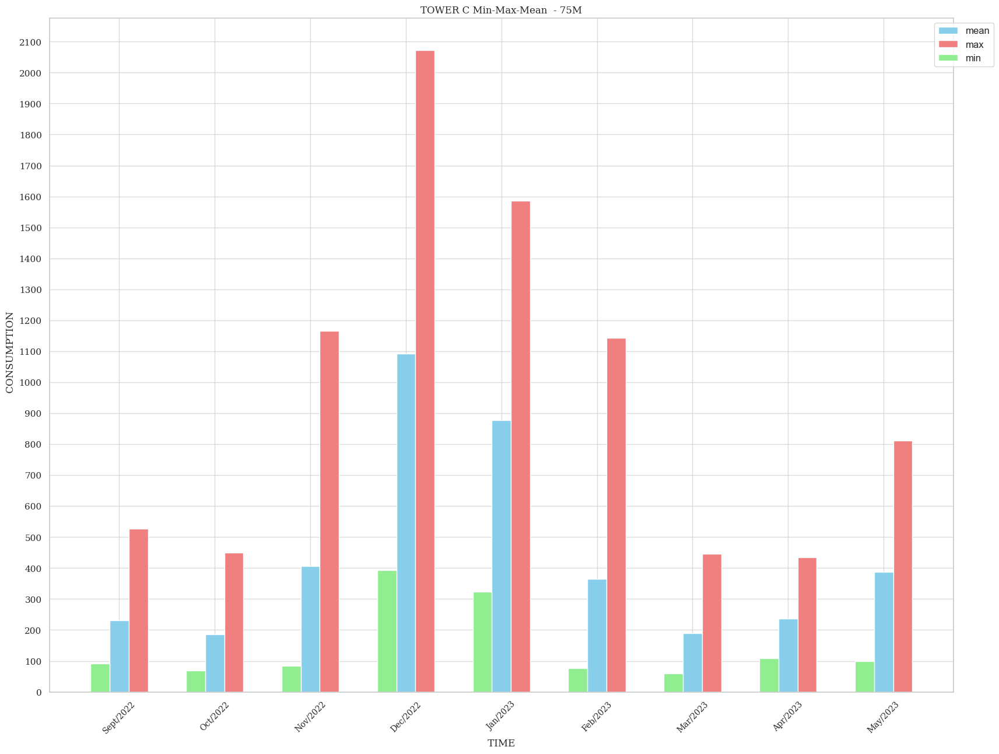

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


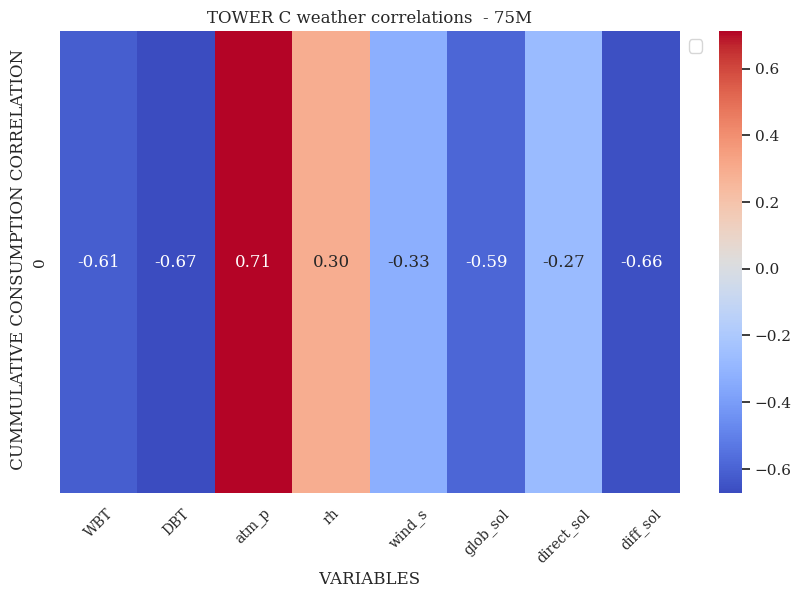

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

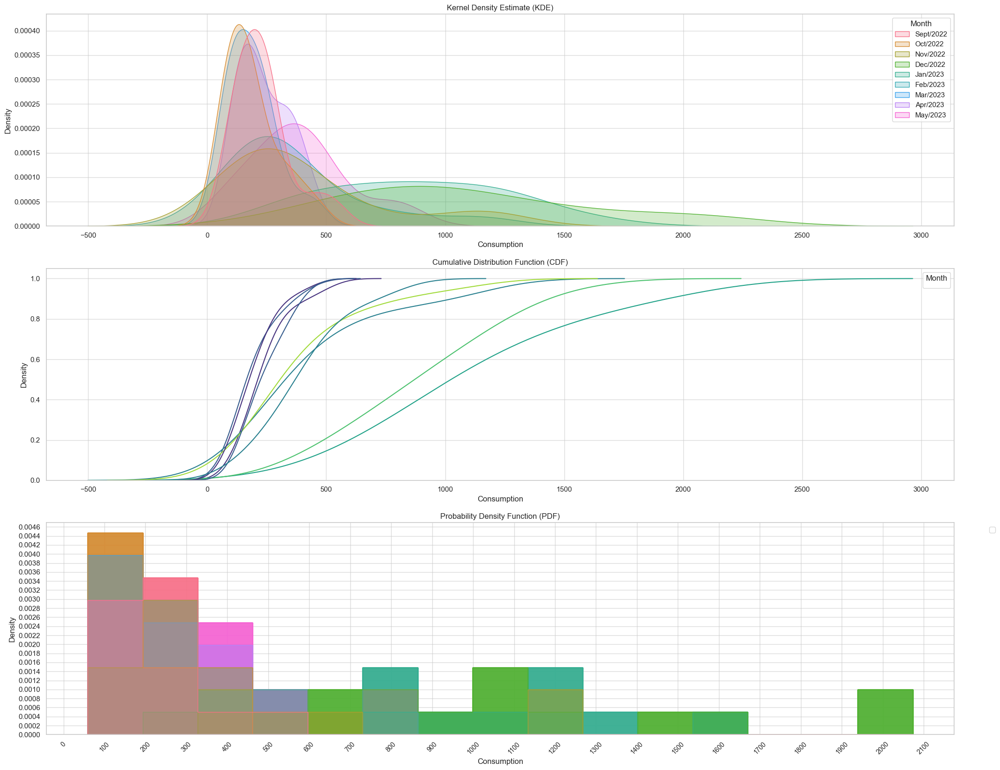

--------------------PLOT EXIT -------------------


In [401]:
### GRAPHS FOR CLUSTERS-TOWERS 

for clust in all_tow_clusters:
    
    weather_accu=[]
    tower='000'
    mark='000'
    house_id=str(clust.iloc[0,-2])
    percentile=clust.iloc[2,-1]
    markers=["*",">","^","v","X","D","H","s","+","8","p","P","o","d","h"]
    clust_columns=list(clust.describe().columns[:-3])
    clust_describe=clust.describe()
    clust_means=list(clust_describe.iloc[1,:-3])
    clust_maxes=list(clust_describe.iloc[7,:-3])
    clust_mines=list(clust_describe.iloc[3,:-3])
    
    clust_temp=clust.iloc[:,:-3]
    sum_alg_months=list(clust_temp.sum(axis=0))
    clust_melted=clust_temp.melt(var_name="Month",value_name="Consumption")

    for i in weather:
        w_temp=i
        corr=np.corrcoef(w_temp,sum_alg_months)
        corr=corr[0,1]
        weather_accu.append(corr)
        del w_temp
        del corr
    
    
    clust_corr_data=clust.iloc[:,:-3]
    clust_corr_matrix=clust_corr_data.corr()
    
    print("house id ",house_id[0])
    print("\n")
    print("percentile is ",percentile)
    
    if percentile<0.25:
        mark='L25'
        print("l25 mark chk")
    elif 0.25<percentile<0.50:
        mark='25T50'
        print("25t50 mark chk")
    elif 0.50<percentile<0.75:
        mark='50T75'
        print("50t75 mark chk")
    elif 0.75<percentile:
        mark='75M'
        print("75m mark chk")
        
    if house_id[0]=='1':
        tower='A'
    elif house_id[0]=='2':
        tower='B'
    elif house_id[0]=='3':
        tower='C'
        
    
        
    clust_keys=[i for i in clust.iloc[:,-2]]
    clust_months=clust.columns[:-3]

    master_clust={}
    for i in range(len(clust_keys)):
        month_tuple=[]
        
        for j in range(len(months)):
            temp=(months[j],clust.iloc[i,j])
            month_tuple.append(temp)
        
        master_clust[clust_keys[i]]=month_tuple
        del month_tuple
        




    #############################################################################################################################################################
    plt.figure(figsize=(20, 15)) 
    sb.set_context("paper", font_scale=1.5)
    sb.set(style="whitegrid", rc={"lines.linestyle": "-", "lines.markersize": 6})
    sb.set(style="whitegrid", rc={"axes.grid": True, "grid.linestyle": "--", "grid.alpha": 0.7})
    sb.set(style="whitegrid", font="serif")

    for i in range(len(clust_keys)):
        color = plt.cm.jet(i / len(clust_keys))
        x=[]
        y=[]
        temp_key=clust_keys[i]
        
        temp_list=master_clust[temp_key]
        
        for j in range(len(temp_list)):
            temp_tuple=temp_list[j]
            
            x.append(temp_tuple[0])
            y.append(temp_tuple[1])
            
        sb.lineplot(x=x,y=y,marker=markers[i], markersize=12,label=f'{code_house[clust_keys[i]]}')
        
    sb.lineplot(x=x,y=clust_means, label='Mean ',marker=True, markersize=20,color='red', linestyle='-.', linewidth=3)
    std=np.std(clust_means)
    plt.fill_between(x,clust_means-std,clust_means+std,color='red',alpha=0.1)
    
    
    
    
    plt.xticks(rotation=45)
    plt.locator_params(axis='y', nbins=40)
    plt.xlabel(' TIME ')
    plt.ylabel('  CONSUMPTION')
    sb.set(style='whitegrid', palette='viridis')  
    plt.title(f'TOWER {tower} HOUSEHOLD CONSUMPTION TREND - {mark}')
    plt.legend(bbox_to_anchor=(1.05, 1.0),loc='upper right', fontsize='medium')
    # plt.xlim(datetime.datetime(2022, 3, 1, 0, 0), datetime.datetime(2023, 5, 1, 0, 0))

    plt.show()
    
    
    
    
    ############################################################################################################################################################3
    plt.figure(figsize=(20, 15)) 
    sb.set_context("paper", font_scale=1.5)
    sb.set(style="whitegrid", rc={"lines.linestyle": "-", "lines.markersize": 6})
    sb.set(style="whitegrid", rc={"axes.grid": True, "grid.linestyle": "--", "grid.alpha": 0.7})
    sb.set(style="whitegrid", font="serif")

    sb.heatmap(clust_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5) 

    plt.xticks(rotation=45)
    plt.locator_params(axis='y', nbins=40)
    plt.xlabel(' TIME ')
    plt.ylabel('  CONSUMPTION')
    sb.set(style='whitegrid', palette='viridis')  
    plt.title(f'TOWER {tower} Correlation  - {mark}')
    plt.legend(bbox_to_anchor=(1.05, 1.0),loc='upper right', fontsize='medium')
    
    plt.show()
    
    
    
    
    
    ###########################################################################################################################################################
    plt.figure(figsize=(20, 15)) 
    sb.set_context("paper", font_scale=1.5)
    sb.set(style="whitegrid", rc={"lines.linestyle": "-", "lines.markersize": 6})
    sb.set(style="whitegrid", rc={"axes.grid": True, "grid.linestyle": "--", "grid.alpha": 0.7})
    sb.set(style="whitegrid", font="serif")
    
    x = np.arange(len(clust_columns))
    bar_width=0.2
    plt.bar(x,clust_means , color='skyblue',label='mean',width=bar_width)
    plt.bar(x+bar_width,clust_maxes , color='lightcoral',label='max',width=bar_width)
    plt.bar(x-bar_width,clust_mines , color='lightgreen',label='min',width=bar_width)
    
    plt.xticks(x, clust_columns, rotation=45, fontsize=10)
    plt.locator_params(axis='y', nbins=40)
    plt.xlabel(' TIME ')
    plt.ylabel('  CONSUMPTION')
    sb.set(style='whitegrid', palette='viridis')  
    plt.title(f'TOWER {tower} Min-Max-Mean  - {mark}')
    plt.legend(bbox_to_anchor=(1.05, 1.0),loc='upper right', fontsize='medium')
    
    plt.show()
    
    
    #############################################################################################################################################################
    plt.figure(figsize=(10, 6)) 
    sb.set_context("paper", font_scale=1.5)
    sb.set(style="whitegrid", rc={"lines.linestyle": "-", "lines.markersize": 6})
    sb.set(style="whitegrid", rc={"axes.grid": True, "grid.linestyle": "--", "grid.alpha": 0.7})
    sb.set(style="whitegrid", font="serif")
    
    sb.heatmap([weather_accu], cmap='coolwarm', cbar=True, xticklabels=weather_lab, annot=True, fmt=".2f")
   
    plt.xticks(rotation=45, fontsize=10)
    plt.locator_params(axis='y', nbins=40)
    plt.xlabel(' VARIABLES ')
    plt.ylabel(' CUMMULATIVE CONSUMPTION CORRELATION')
    sb.set(style='whitegrid', palette='viridis')  
    plt.title(f'TOWER {tower} weather correlations  - {mark}')
    plt.legend(bbox_to_anchor=(1.05, 1.0),loc='upper right', fontsize='medium')
    
    plt.show()
    ##############################################################################################################################################################
    fig,axes=plt.subplots(nrows=3,ncols=1,figsize=(25,20))
    # sb.set_context("paper", font_scale=1.5)
    # sb.set(style="whitegrid", rc={"lines.linestyle": "-", "lines.markersize": 6})
    # sb.set(style="whitegrid", rc={"axes.grid": True, "grid.linestyle": "--", "grid.alpha": 0.7})
    # sb.set(style="whitegrid", font="serif")
    
    sb.kdeplot(data=clust_melted,x='Consumption', hue='Month', fill=True, ax=axes[0])
    axes[0].set_title('Kernel Density Estimate (KDE)')

    for month in clust_melted['Month'].unique():
        sb.kdeplot(data=clust_melted[clust_melted['Month'] == month]['Consumption'], cumulative=True, ax=axes[1])
        axes[1].set_title('Cumulative Distribution Function (CDF)')
        axes[1].legend(title='Month')

        # # PL25 plot
        sb.histplot(data=clust_melted, x='Consumption', hue='Month', element='step', stat='density', common_norm=False, ax=axes[2])
        axes[2].set_title('Probability Density Function (PDF)')
        axes[2].legend(title='Month')
   
    plt.xticks(rotation=45, fontsize=10)
    plt.locator_params(axis='y', nbins=30)
    plt.locator_params(axis='x', nbins=40)
    
    
    
    sb.set(style='whitegrid', palette='viridis')  
    # plt.title(f'TOWER {tower} PROBABILISTIC PLOTS  - {mark}')
    plt.legend(bbox_to_anchor=(1.05, 1.0),loc='upper right', fontsize='medium')
    
    plt.show()
    #######################################################################################################################################################
  

    
    
    print("--------------------PLOT EXIT -------------------")
    del tower
    del mark
    del house_id
    del percentile
    del clust_keys
    del clust_months
    del master_clust
    del clust_corr_data
    del clust_corr_matrix
    del clust_describe
    del clust_means
    del weather_accu
    #sb.heatmap(clust_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)  
    

        
